In [1]:
import pandas as pd
import scipy as sp
from scipy import stats
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
import mat4py
from scipy.signal import savgol_filter
import lmfit as lf
import time
import corner

import csv

try:
    plt.style.use(
        "https://raw.githubusercontent.com/sheamusfitz/mpl-styles/main/biophysj.mplstyle")
except:
    print('no plot formatting, sad')


import h5py

# ==IMPORTANT!!!==

In [56]:
saving = False

# Defining Functions

In [2]:
def amp_margin(guess, confidence=0.5):
    '''
    outputs a minimum and maximum for an amplitude guess between 0 and 1.
    The "confidence" must also be between 0 and 1.
    '''
    def temp(a, b):
        return a*b / (1-a+a*b)
    
    return temp(guess, 1/confidence), temp(guess, confidence)

In [3]:
def fixhist(sig):
    out = np.clip(np.copy(sig), 0, np.inf)
    out /= np.sum(out)
    return out
    
def onegauss(x, m1, s1, a1):
    factor = a1 / (s1 * np.sqrt(2 * np.pi))
    return factor * np.exp(-0.5 * ((x - m1) / s1) ** 2)

onegauss_model = lf.Model(onegauss, independent_vars='x')

def twogauss(x, m1, m2, s1, s2, a1, a2):
    return onegauss(x, m1, s1, a1) + onegauss(x, m2, s2, a2)
twogauss_model = lf.Model(twogauss, independent_vars='x')

def threegauss(x, m1, m2, m3, s1, s2, s3, a1, a2, a3):
    return (onegauss(x, m1, s1, a1) +
            onegauss(x, m2, s2, a2) +
            onegauss(x, m3, s3, a3))
threegauss_model = lf.Model(threegauss, independent_vars='x')

def fourgauss(x, m1, m2, m3, m4, s1, s2, s3, s4, a1, a2, a3, a4):
    return (onegauss(x, m1, s1, a1) +
            onegauss(x, m2, s2, a2) +
            onegauss(x, m3, s3, a3) +
            onegauss(x, m4, s4, a4))
fourgauss_model = lf.Model(fourgauss, independent_vars='x')

def fivegauss(x, m1, m2, m3, m4, m5, s1, s2, s3, s4, s5, a1, a2, a3, a4, a5):
    return (onegauss(x, m1, s1, a1) +
            onegauss(x, m2, s2, a2) +
            onegauss(x, m3, s3, a3) +
            onegauss(x, m4, s4, a4) +
            onegauss(x, m5, s5, a5))
fivegauss_model = lf.Model(fivegauss, independent_vars='x')

def sixgauss(x, m1, m2, m3, m4, m5, m6, s1, s2, s3, s4, s5, s6, a1, a2, a3, a4, a5, a6):
    return (onegauss(x, m1, s1, a1) +
            onegauss(x, m2, s2, a2) +
            onegauss(x, m3, s3, a3) +
            onegauss(x, m4, s4, a4) +
            onegauss(x, m5, s5, a5) +
            onegauss(x, m6, s6, a6))
sixgauss_model = lf.Model(sixgauss, independent_vars='x')


In [4]:
# Fast second derivative for a single Gaussian
def onegpp(x, m1, s1, a1):
    gauss_val = onegauss(x, m1, s1, a1)
    return ((x - m1)**2 - s1**2) / s1**4 * gauss_val

onegpp_model = lf.Model(onegpp, independent_vars='x')

# Functions for multiple Gaussians with second derivatives
def twogpp(x, m1, m2, s1, s2, a1, a2):
    return onegpp(x, m1, s1, a1) + onegpp(x, m2, s2, a2)
twogpp_model = lf.Model(twogpp, independent_vars='x')

def threegpp(x, m1, m2, m3, s1, s2, s3, a1, a2, a3):
    return (onegpp(x, m1, s1, a1) +
            onegpp(x, m2, s2, a2) +
            onegpp(x, m3, s3, a3))
threegpp_model = lf.Model(threegpp, independent_vars='x')

def fourgpp(x, m1, m2, m3, m4, s1, s2, s3, s4, a1, a2, a3, a4):
    return (onegpp(x, m1, s1, a1) +
            onegpp(x, m2, s2, a2) +
            onegpp(x, m3, s3, a3) +
            onegpp(x, m4, s4, a4))
fourgpp_model = lf.Model(fourgpp, independent_vars='x')

def fivegpp(x, m1, m2, m3, m4, m5, s1, s2, s3, s4, s5, a1, a2, a3, a4, a5):
    return (onegpp(x, m1, s1, a1) +
            onegpp(x, m2, s2, a2) +
            onegpp(x, m3, s3, a3) +
            onegpp(x, m4, s4, a4) +
            onegpp(x, m5, s5, a5))
fivegpp_model = lf.Model(fivegpp, independent_vars='x')

def sixgpp(x, m1, m2, m3, m4, m5, m6, s1, s2, s3, s4, s5, s6, a1, a2, a3, a4, a5, a6):
    return (onegpp(x, m1, s1, a1) +
            onegpp(x, m2, s2, a2) +
            onegpp(x, m3, s3, a3) +
            onegpp(x, m4, s4, a4) +
            onegpp(x, m5, s5, a5) +
            onegpp(x, m6, s6, a6))
sixgpp_model = lf.Model(sixgpp, independent_vars='x')

# loading data

In [5]:
# Obviously it isn't necessary to do this using mat4py. I was originally given files in 
# matlab format, so I needed to use this package
diagonals = mat4py.loadmat('../2dir-spectra/Diagonal_slice.mat')

# this line (and the next few code blocks) are just telling me how to access the data in the array
diagonals.keys() # dict

dict_keys(['DPPCEster', 'PSMAmide'])

In [6]:
diagonals['DPPCEster'].keys() # dict

dict_keys(['DiagonalSlices', 'Freq', 'label'])

In [7]:
np.array(diagonals['DPPCEster']['DiagonalSlices']).shape
# list, with an extra axis for some reason

(4, 164, 1)

In [8]:
np.array(diagonals['DPPCEster']['Freq']).shape
# another list, saved as one list of freqs per system, but they're all the same.

(4, 164)

In [9]:
diagonals['DPPCEster']['label']

['corrected diagonal slice 100%DPPC',
 'corrected diagonal slice 75%DPPC',
 'corrected diagonal slice 50%DPPC',
 'corrected diagonal slice 25%DPPC']

In [10]:
diagonals['PSMAmide']['label']

['corrected diagonal slice 0%DPPC',
 'corrected diagonal slice 25%DPPC',
 'corrected diagonal slice 50%DPPC',
 'corrected diagonal slice 75%DPPC']

In [57]:
out = np.zeros((2, 151))
out[0] = diagonals['DPPCEster']['Freq'][0][:151]
out[1] = np.array(diagonals['DPPCEster']['DiagonalSlices'])[0,:151,0]
if saving:
    np.savetxt("/Users/shea/dcuments/research/psm-postdoc/data/100dppc-carlos-spec.txt", out.T, delimiter="\t", fmt=['%4.0f', '%10.5f'])

# exploring the data

always plot your data to make sure you arent going crazy!

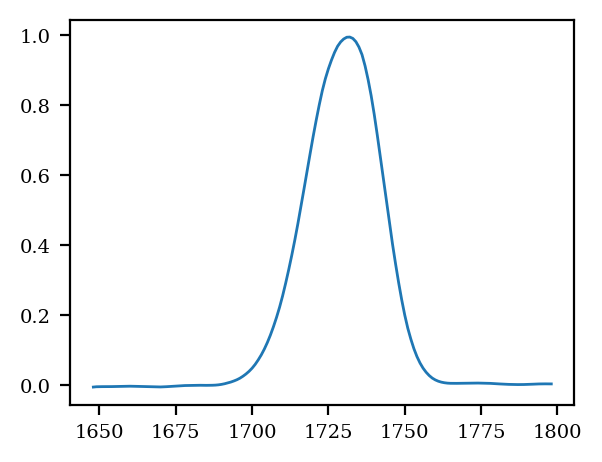

In [12]:

plt.plot(out[0], out[1])
# plt.yscale('log')
plt.show()

In [13]:
# diagonals.keys()
dppc_ester = np.array(diagonals['DPPCEster']['DiagonalSlices'])
dppc_freqs = np.array(diagonals['DPPCEster']['Freq'])[0]


print(diagonals.keys())
psm_amide = np.array(diagonals['PSMAmide']['DiagonalSlices'])
print(psm_amide.shape)
print(dppc_ester.shape)
psm_freqs = np.array(diagonals['PSMAmide']['Freq'])[0]
psm_freqs.shape

dict_keys(['DPPCEster', 'PSMAmide'])
(4, 137)
(4, 164, 1)


(137,)

sometimes it's useful to plot the difference between two spectra. Again, do whatever you need to.

(-0.25, 0.25)

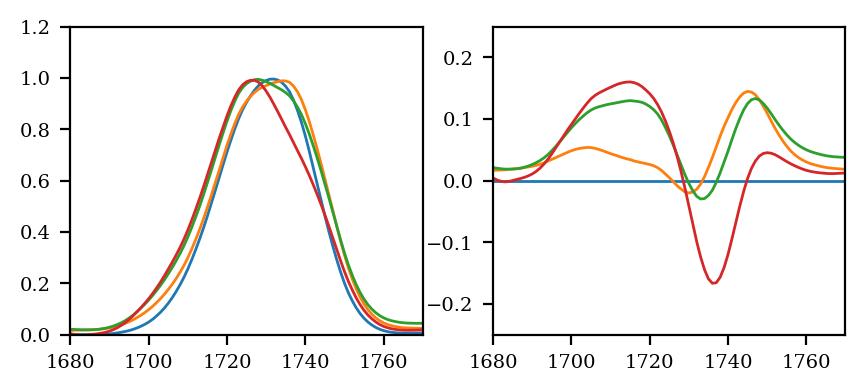

In [14]:
plt.subplots(1, 2, figsize=(5, 2))
for i in range(4):
    plt.subplot(121)
    plt.plot(dppc_freqs, dppc_ester[i][:, 0], f'C{i}')
    plt.subplot(122)
    plt.plot(dppc_freqs, dppc_ester[i][:, 0] - dppc_ester[0][:, 0], f'C{i}')
for subp in range(2):
    plt.subplot(1, 2, subp+1)
    plt.xlim(1680, 1770)
plt.subplot(121)
plt.ylim(0,1.2)

plt.subplot(122)
plt.ylim(-0.25, 0.25)

the "savgol_filter" is a "savitsky golay filter", which is a very good way to smooth data and
to take derivatives. here, I'm plotting the second derivative of all the spectra, from a 3rd-order
savgol filter (i.e. it's fitting to cubic polynomials. You can go higher, but not lower).
The "width" is also configurable, and this plot was just me looking at my options.

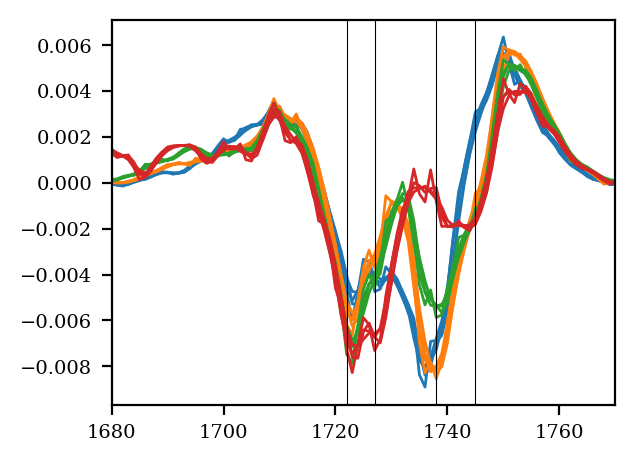

In [15]:
for i in range(4):
    for width in [4, 5, 6, 7]:
        plt.plot(dppc_freqs, savgol_filter(dppc_ester[i][:, 0], width, 3, 2), f'C{i}')


plt.xlim(1680, 1770)
for val in [1722, 1727, 1738, 1745]:
    plt.axvline(val, c='k', lw=0.4)


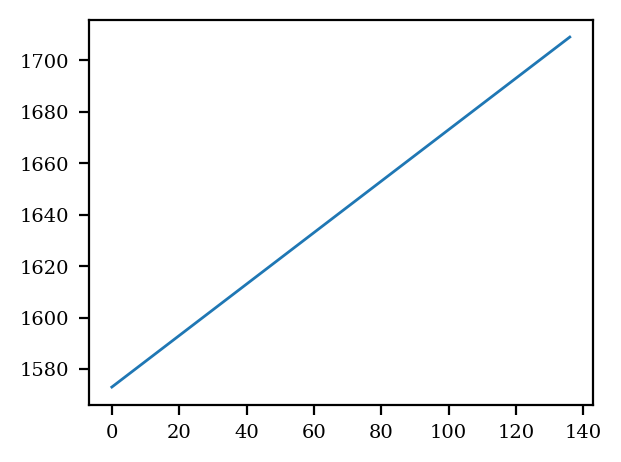

In [16]:
plt.plot(psm_freqs)

(-0.3, 0.4)

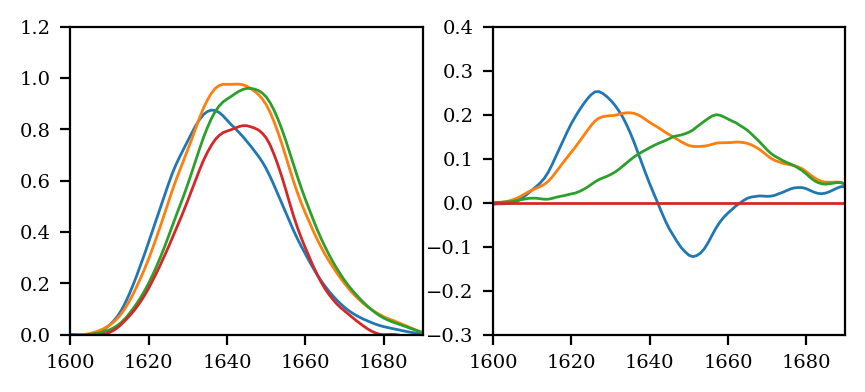

In [17]:
plt.subplots(1, 2, figsize=(5, 2))
for i in range(4):
    plt.subplot(121)
    temp = psm_amide[i][:]
    plt.plot(psm_freqs, psm_amide[i][:], f'C{i}')
    plt.subplot(122)
    plt.plot(psm_freqs, psm_amide[i][:] - psm_amide[3][:], f'C{i}')
for subp in range(2):
    plt.subplot(1, 2, subp+1)
    plt.xlim(1600,1690)
    # for val in (1585, 1622, 1650, 1675):
    #     plt.axvline(val)
plt.subplot(121)
plt.ylim(0,1.2)

plt.subplot(122)
plt.ylim(-0.3, 0.4)

here, i'm just using the second derivative to guess at bounds on the peak locations

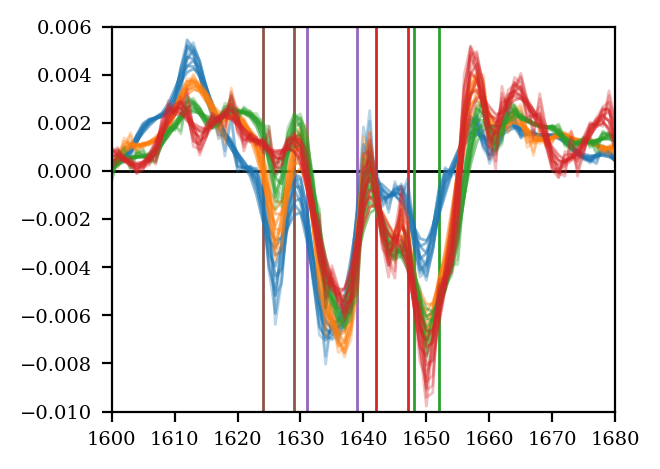

In [18]:
for i in range(4):
    for width in range(3, 10):
        for order in range(2, 5):
            if width > order:
                plt.plot(psm_freqs, savgol_filter(psm_amide[i][:], width, order, 2), c=f'C{i}', alpha=0.3)
    # plt.plot(psm_freqs[1:-1], np.diff(psm_amide[i][:], 2), f'k.', ms=1)
plt.ylim(-0.01, 0.006)
plt.xlim(1600, 1680)
# plt.gca().invert_xaxis()
plt.axhline(0, zorder=-100, c='k')

vlinezorder = -100

plt.axvline(1648, c='C2', zorder=vlinezorder)
plt.axvline(1652, c='C2', zorder=vlinezorder)

plt.axvline(1642, c='C3', zorder=vlinezorder)
plt.axvline(1647, c='C3', zorder=vlinezorder)

plt.axvline(1631, c='C4', zorder=vlinezorder)
plt.axvline(1639, c='C4', zorder=vlinezorder)

plt.axvline(1624, c='C5', zorder=vlinezorder)
plt.axvline(1629, c='C5', zorder=vlinezorder)
plt.show()

Here, I plotted the data on a linear and a log scale. I wanted to know exactly where to start and end the 
fits (like, minimum and maximum frequencies to use).

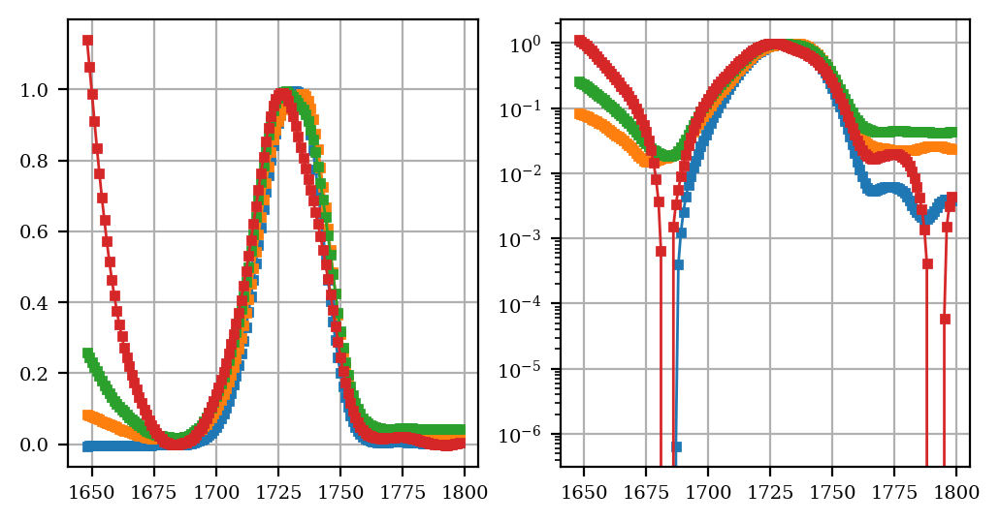

In [19]:
plt.subplots(1, 2, figsize=(6, 3))
for s in [1, 2]:
    plt.subplot(1, 2, s)
    for i in range(4):
        plt.plot(dppc_freqs, dppc_ester[i], 's-', ms=3, lw=1)
    # plt.xlim(56, 105)
    # plt.xlim(100, 111)
    plt.grid(True)
plt.yscale('log')
# plt.ylim(0.09, 1.5)

plt.subplot(121)
# plt.ylim(0.09, 0.2)
plt.show()

# alright, it's time to fit the curves

(0.0, 1.0259495803287053)

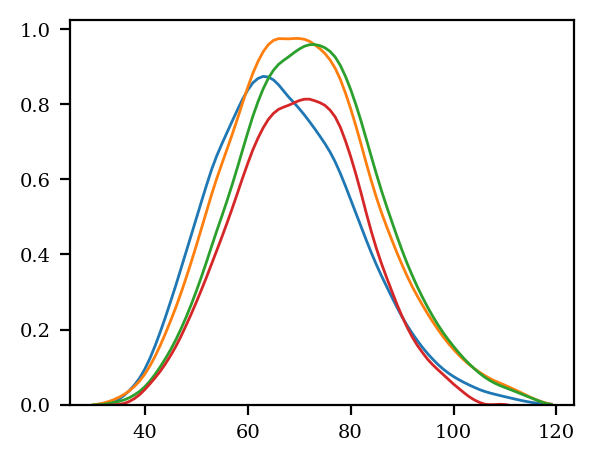

In [20]:
first, last = 30, 120
for s in range(4):
    plt.plot(np.arange(first, last), psm_amide[s, first:last])
plt.ylim(bottom=0)

In [21]:
try:
    deltas
except:
    deltas = {}

method: basinhopping
>>>	6sixgauss,	1k basinhopping steps: 1.5s
>>>>	6sixgauss,	10k basinhopping steps: 14 - 15s
>>>>>	6sixgauss,	100k basinhopping steps: 2m24 - 2m30 (144-150s)
>>>>>>	6sixgauss,	1M basinhopping steps: 27m41s (1661s)		unfinished
>>>>>>	6sixgauss,	1M basinhopping steps: 10m40s - 12m10s (640-730s)	finished early
0 1 m1
1 1 m2
2 1 m3
3 1 m4
4 1 m5
5 1 m6
6 2 s1
7 3 s2
8 4 s3
9 5 s4
10 6 s5
11 7 s6
12 8 a1
13 9 a2
14 10 a3
15 11 a4
16 12 a5
17 13 a6
18 14 co
19 15 nh_
20 15 nh
21 16 mtol2
22 17 mtol3
23 18 mtol4
24 19 mtol5
25 20 mtol6
Sat Jun 21 15:21:19 2025
after 1000 evaluations:
which took  0m  0.1s
which is 7482.7 fev/sec


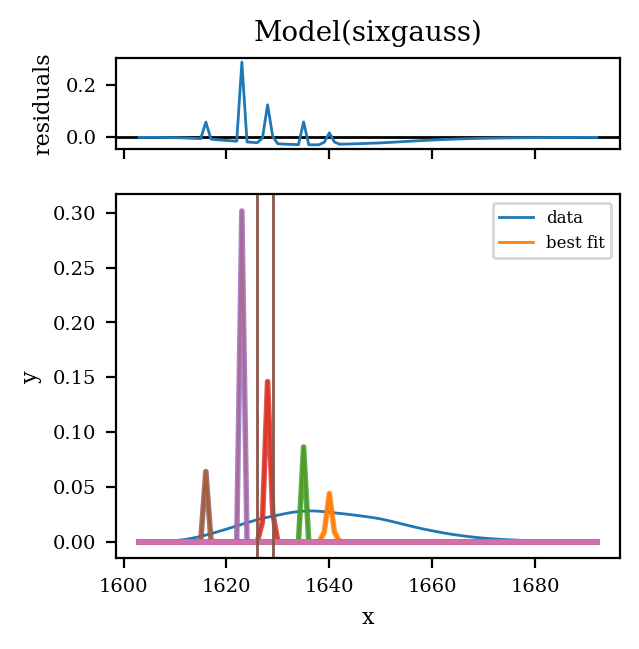

Sat Jun 21 15:21:19 2025
after 1000 evaluations:
which took  0m  0.1s
which is 7865.7 fev/sec


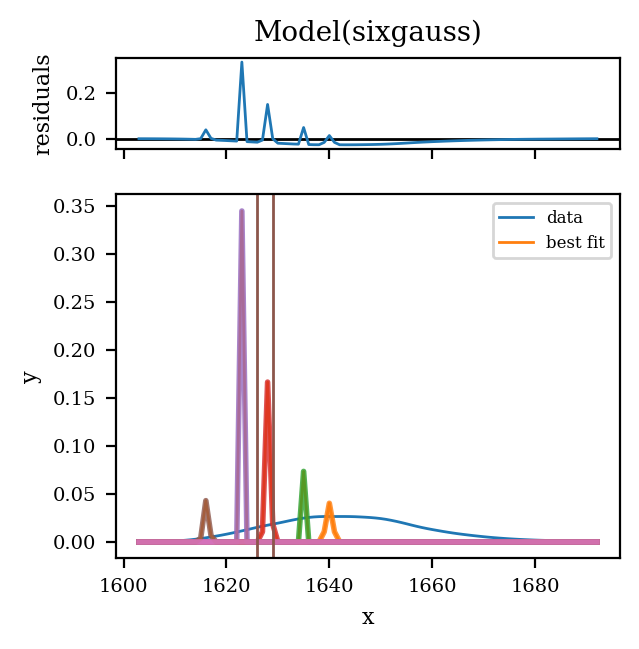

Sat Jun 21 15:21:20 2025
after 1000 evaluations:
which took  0m  0.1s
which is 8239.5 fev/sec


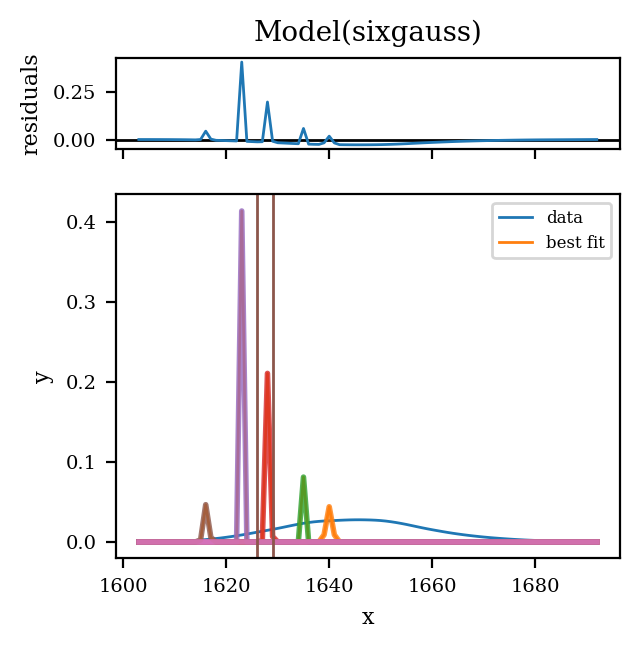

Sat Jun 21 15:21:20 2025
after 1000 evaluations:
which took  0m  0.1s
which is 8258.7 fev/sec


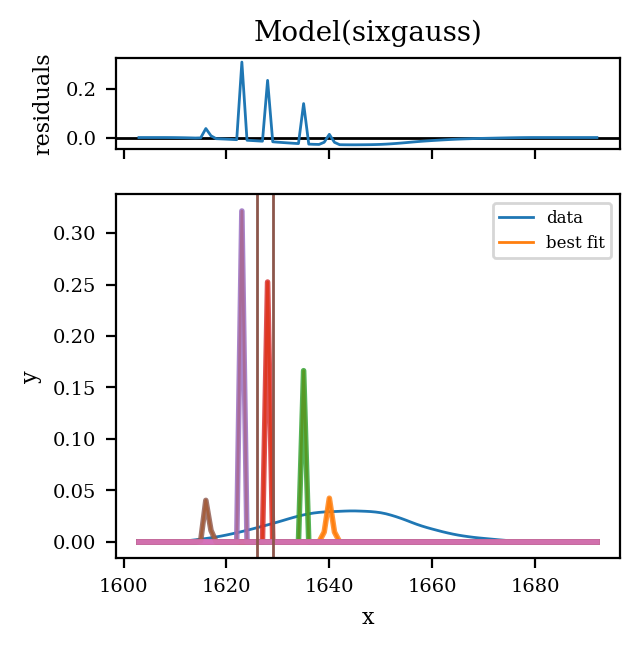

In [23]:
first, last = 30, 120 # need the first and last frequencies you're going to use

method= 'basinhopping'
max_nfev = 1000 # 1_000_000: I used 1million here. Right now it's only 100 because I'm testing stuff.
is_weighted = False

sixgauss_pars = sixgauss_model.make_params()
mmax = 1680

sixgauss_pars.add('m1', min=1640, max=1670, value=1659.6)
tol = 2.0 # 2 # multiply by 1.2 each time?
# sixgauss_pars.add('co', min=10, max=25, value=14.5)
# sixgauss_pars.add('nh_', min=0.1, max=20, value=8.5)
sixgauss_pars.add('co', min=12, max=20, value=16.3) # 12, 16, 20
sixgauss_pars.add('nh_', min=5, max=9, value=7.3)   # 5, 7, 9
sixgauss_pars.add('nh', expr='min(nh_, co)')

sixgauss_pars.add('mtol2', min=-tol, max=tol, value=0)
sixgauss_pars.add('m2', expr=('m1-nh+mtol2'))

sixgauss_pars.add('mtol3', min=-tol, max=tol, value=0)
sixgauss_pars.add('m3', expr=('m1-co+mtol3'))

sixgauss_pars.add('mtol4', min=-tol, max=tol, value=0)
sixgauss_pars.add('m4', expr=('((m3-nh)+(m2-co))/2 + mtol4'))

sixgauss_pars.add('mtol5', min=-tol, max=tol, value=0)
sixgauss_pars.add('m5', expr=('m3-co+mtol5'))

sixgauss_pars.add('mtol6', min=-tol, max=tol, value=0)
sixgauss_pars.add('m6', expr=('((m5-nh)+(m4-co))/2 + mtol6'))




smax = 13
smin = 1e-5
sixgauss_pars.add('s1', min=smin, max=smax, value=9.9)
sixgauss_pars.add('s2', min=smin, max=smax, value=9.0)
sixgauss_pars.add('s3', min=smin, max=smax, value=7.9)
sixgauss_pars.add('s4', min=smin, max=smax, value=5.7)
sixgauss_pars.add('s5', min=smin, max=7, value=4.0)
sixgauss_pars.add('s6', min=smin, max=smax, value=5.5)

themargin = 0.5

a_ = 0.116
mina, maxa = amp_margin(a_, themargin)
sixgauss_pars.add('a1', min=mina, max=maxa, value=a_)

a_ = 0.102
mina, maxa = amp_margin(a_, themargin)
sixgauss_pars.add('a2', min=mina, max=maxa, value=a_)

a_ = 0.318
mina, maxa = amp_margin(a_, themargin)
sixgauss_pars.add('a3', min=mina, max=maxa, value=a_)

a_ = 0.281
mina, maxa = amp_margin(a_, themargin)
sixgauss_pars.add('a4', min=mina, max=maxa, value=a_)

a_ = 0.100
mina, maxa = amp_margin(a_, themargin)
sixgauss_pars.add('a5', min=mina, max=maxa, value=a_)

a_ = 0.084
mina, maxa = amp_margin(a_, themargin)
sixgauss_pars.add('a6', min=mina, max=maxa, value=a_)






print('method:', method)

print('>>>\t6sixgauss,\t1k basinhopping steps: 1.5s')
print('>>>>\t6sixgauss,\t10k basinhopping steps: 14 - 15s')
print('>>>>>\t6sixgauss,\t100k basinhopping steps: 2m24 - 2m30 (144-150s)')
print('>>>>>>\t6sixgauss,\t1M basinhopping steps: 27m41s (1661s)\t\tunfinished')
print('>>>>>>\t6sixgauss,\t1M basinhopping steps: 10m40s - 12m10s (640-730s)\tfinished early')

numpars = 0

for i, par in enumerate(sixgauss_pars):
    if sixgauss_pars[par].vary:
        numpars += 1
#     numpars += 1
    print(i, numpars, par)



try:
    deltas
except:
    deltas = {}

##################################################
systems = ['PSM-25', 'PSM-50', 'PSM-75', 'PSM-100']
# for s, system in enumerate(systems):
for s, system in enumerate(systems):
    ##################################################
    # initials
    ##################################################
    use_i = 0
    if method == 'emcee':
        for i, par in enumerate(sixgauss_pars):
            if not sixgauss_pars[par].vary:
                continue
    
            mmin = 1e-10 if (np.isnan(sixgauss_pars[par].min) or np.isinf(sixgauss_pars[par].min)) else sixgauss_pars[par].min
            vval = 1e-9 if (np.isnan(sixgauss_pars[par].value) or np.isinf(sixgauss_pars[par].value)) else sixgauss_pars[par].value
            mmax = 2 if (np.isnan(sixgauss_pars[par].max) or np.isinf(sixgauss_pars[par].max)) else sixgauss_pars[par].max

            if initialmethod == 'normal':
                parmean = vval
                parstd = min(mmax - vval, vval-mmin)/2
                print(mmin, '{', parmean, parstd, '}', mmax, sep='\t')
                
                initials[:, use_i] = np.random.normal(parmean, parstd, size=nwalkers)
            elif initialmethod == 'uniform':
                initials[:, use_i] = np.random.uniform(mmin, mmax, size=nwalkers)
            use_i += 1
        print(initials.shape, nwalkers, numpars)

    if method == 'emcee':
        fit_kws={'nwalkers' : nwalkers, 'pos': initials, 'steps': nsteps,
                 'is_weighted': is_weighted, 'burn': burn, 'thin': thin}#, 'max_nfev': 10}
    else:
        fit_kws={}

    starttime = time.time()
    print(time.ctime(starttime))

    thishist = fixhist(psm_amide[s, first:last]) # psm_amide[s, first:last]/np.sum(psm_amide[s, first:last])
    
    deltas[f'{system}'] = sixgauss_model.fit(
        thishist, params = sixgauss_pars, method = method, x=psm_freqs[first:last], 
    #     weights = (np.log(tax[first_t:last_t]+2)*0.029)**-2*10,
        # weights = np.ones_like(psm_freqs[first:last])*np.exp(-10.0655)**-1,
        # weights = np.std(e_cor[:, first_t:last_t], axis=0)**-1*np.sqrt(len(e_cor)-1),
        fit_kws = fit_kws, 
        nan_policy='omit',
        max_nfev=max_nfev
    )
    print('after', deltas[f'{system}'].nfev, 'evaluations:')
    endtime = time.time()
    duration = endtime-starttime
    print(f'which took {duration//60:2.0f}m{duration%60:5.1f}s')
    print(f"which is {deltas[f'{system}'].nfev/duration:5.1f} fev/sec")
    deltas[f'{system}'].plot(datafmt='-')

    for i in range(1, 7):
        a = deltas[f'{system}'].best_values[f'a{i}']
        m = deltas[f'{system}'].best_values[f'm{i}']
        s = deltas[f'{system}'].best_values[f's{i}']
        plt.plot(psm_freqs[first:last], onegauss(psm_freqs[first:last], m, s, a), c=f'C{i}', alpha=0.8, lw=2)

    plt.axvline(1626, c='C5')
    plt.axvline(1629, c='C5')
    plt.show()


        
    
    ##################################################
    
    if method=='emcee':
    #     emcee_corner = corner.corner(results.flatchain, labels=results.var_names,
    #                              truths=list(results.params.valuesdict().values()))
    #             results.chain.shape
        plt.subplots((numpars+2)//3,3,figsize=(8,8), dpi=150, constrained_layout=True)
        ii = 0
        for i, par in enumerate(sixgauss_pars):
            print(i,par)
            if sixgauss_pars[par].vary:
    
                plt.subplot((numpars+2)//3, 3, ii+1)
    
                ys = deltas[f'{system}'].chain[:, :, ii]

                plt.plot(ys, 'k', alpha = 10/nwalkers)
                m = np.mean(ys, axis=1)
                plt.plot(m, 'r,')
                s = np.std(ys, axis=1)
                plt.plot(m+s, 'r,')
                plt.plot(m-s, 'r,')
                ylims = plt.ylim()
                plt.axhline(deltas[f'{system}'].params[par].min, c='r')
                plt.axhline(deltas[f'{system}'].params[par].max, c='r')
                plt.axhline(deltas[f'{system}'].params[par].value, c='#44aa44', ls=':', lw=2)
                plt.ylim(ylims)
                plt.title(par)
    #             if par != '__lnsigma':
    #                 plt.yscale('log')
                ii+=1
        plt.show()

In [24]:
deltas['PSM-50']

nwalkers 64 
nsteps 100
method: emcee
>>>	6sixgauss,	1k basinhopping steps: 1.5s
>>>>	6sixgauss,	10k basinhopping steps: 14 - 15s
>>>>>	6sixgauss,	100k basinhopping steps: 2m24 - 2m30 (144-150s)
>>>>>>	6sixgauss,	1M basinhopping steps: 27m41s (1661s)		unfinished
>>>>>>	6sixgauss,	1M basinhopping steps: 10m40s - 12m10s (640-730s)	finished early
0 1 m1
1 2 m2
2 3 m3
3 4 m4
4 5 m5
5 6 m6
6 7 s1
7 8 s2
8 9 s3
9 10 s4
10 11 s5
11 12 s6
12 13 a1
13 14 a2
14 15 a3
15 16 a4
16 17 a5
17 18 a6
18 19 __lnsigma
(64, 19) 64 19
Sat Jun 21 15:21:38 2025
s = 0


100%|█████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:00<00:00, 373.57it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 19 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 2;
tau: [10.55309427 12.19453418 12.28540564  9.98847626 10.22986971 10.16722126
 10.31297315 10.38893838  9.89860428 11.27168963 10.49479163 11.63810943
 11.57468724 10.93432558 11.25356298 10.92755696 12.40624181 12.08340718
 10.82962248]
after 6400 evaluations:
which took  0m  0.3s
which is 20871.6 fev/sec


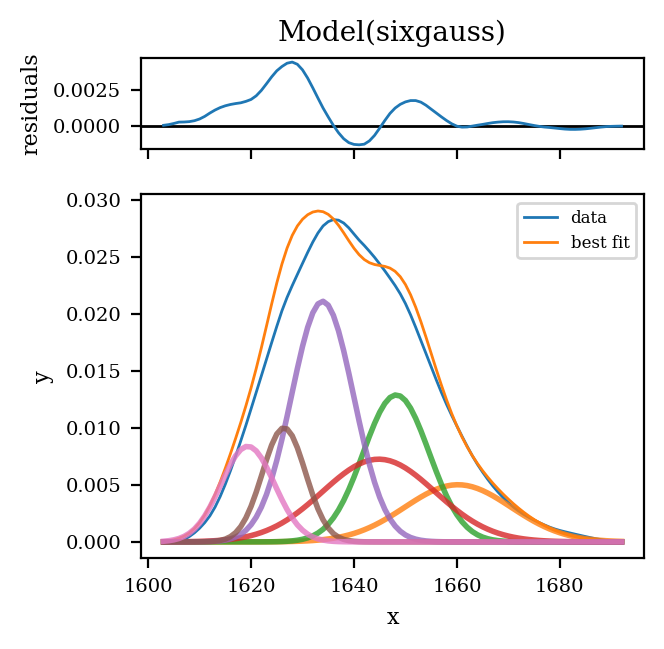

0 m1
1 m2
2 m3
3 m4
4 m5
5 m6
6 s1
7 s2
8 s3
9 s4
10 s5
11 s6
12 a1
13 a2
14 a3
15 a4
16 a5
17 a6
18 __lnsigma


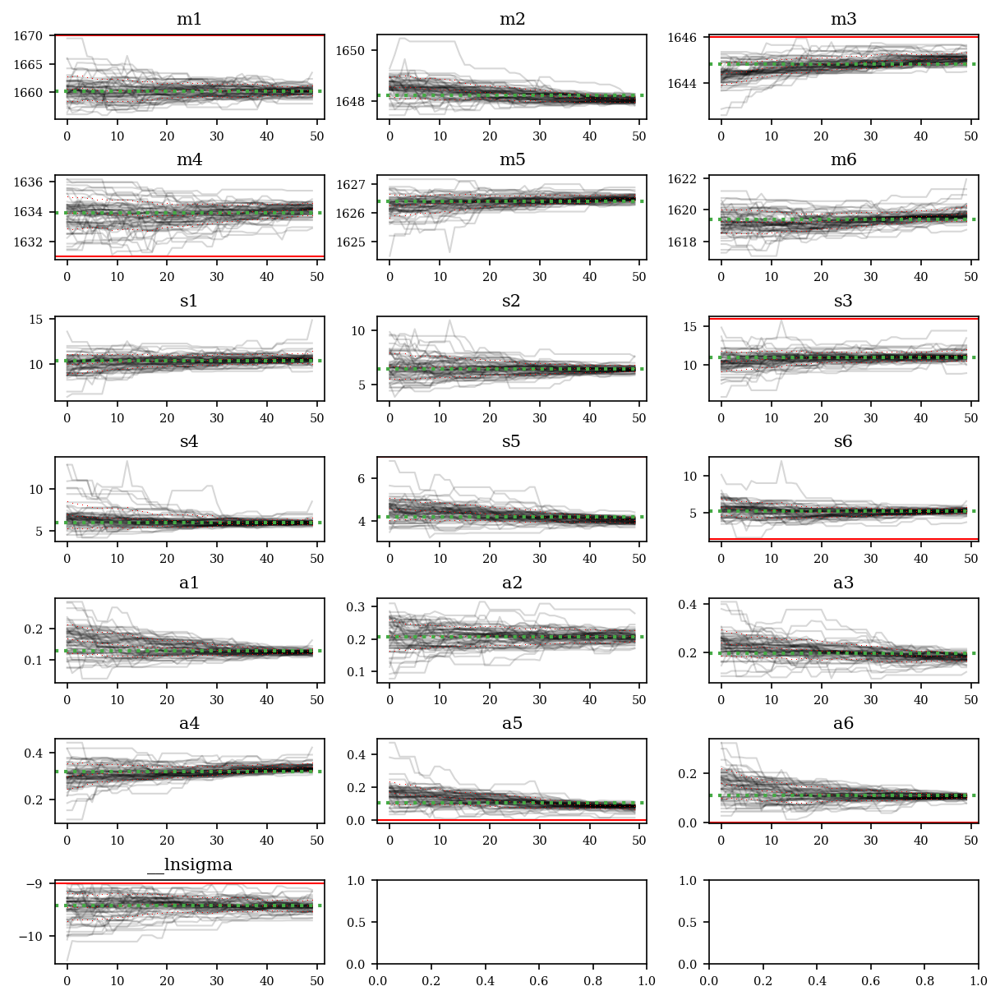

(64, 19) 64 19
Sat Jun 21 15:21:39 2025
s = 1


100%|█████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:00<00:00, 392.95it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 19 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 2;
tau: [11.49898158 10.57769596 10.50422693 10.78179259 10.62147106  9.78723774
 10.78806196 10.0074073  10.37187105 11.08886222 11.27734195 10.98325778
 12.27107638 10.00857781 10.20685778 10.79895703 11.64199975 12.37870913
 11.41294181]
after 6400 evaluations:
which took  0m  0.3s
which is 23208.1 fev/sec


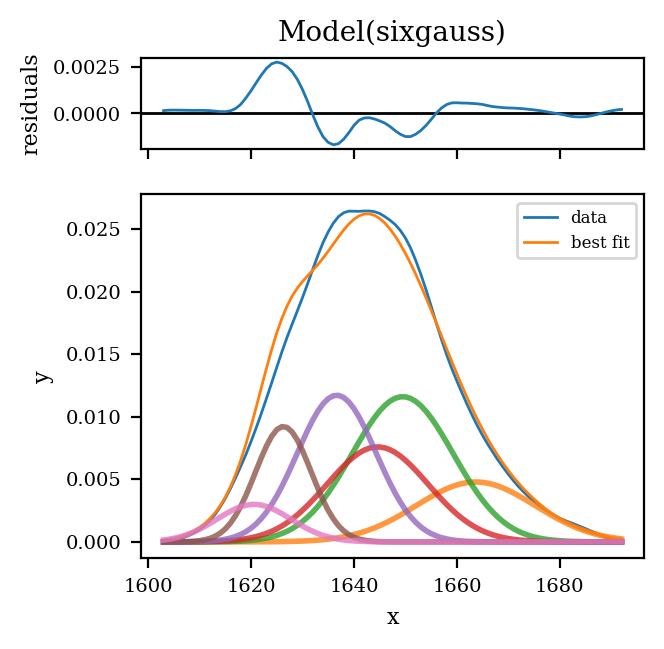

0 m1
1 m2
2 m3
3 m4
4 m5
5 m6
6 s1
7 s2
8 s3
9 s4
10 s5
11 s6
12 a1
13 a2
14 a3
15 a4
16 a5
17 a6
18 __lnsigma


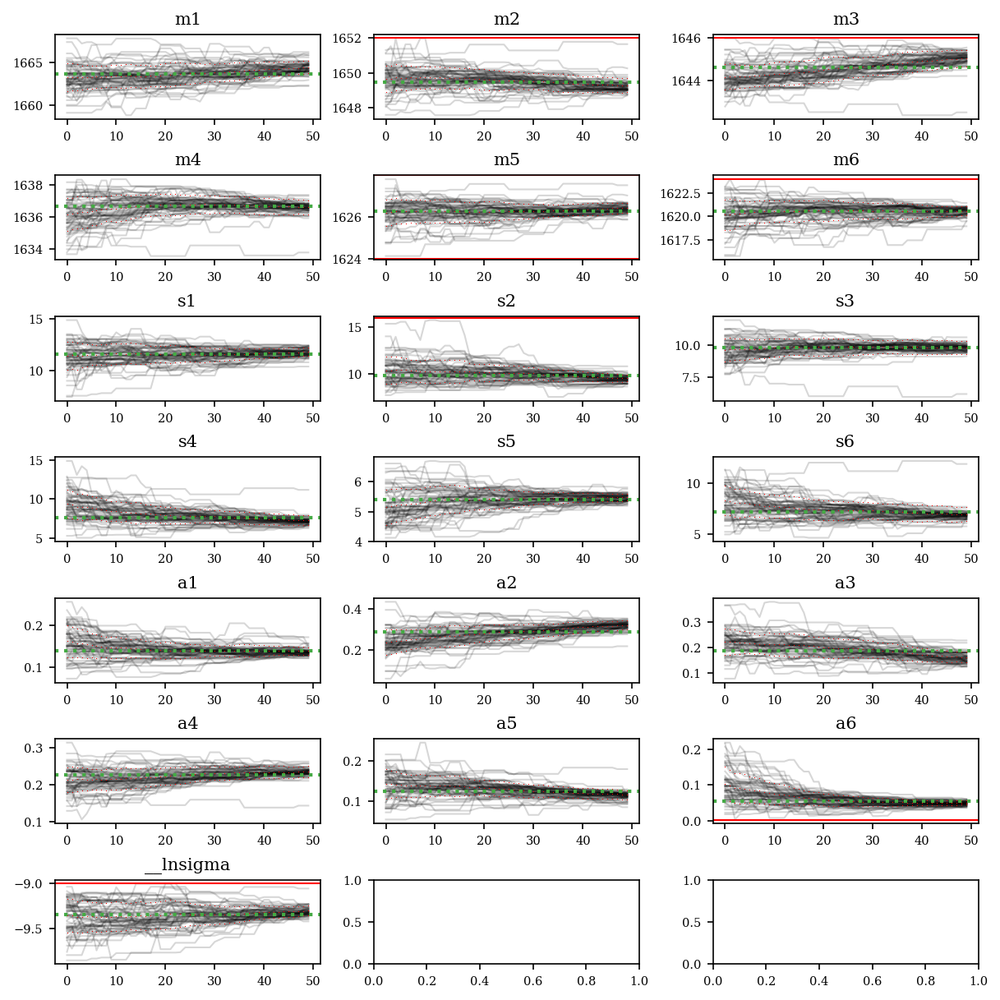

(64, 19) 64 19
Sat Jun 21 15:21:41 2025
s = 2


100%|█████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:00<00:00, 376.45it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 19 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 2;
tau: [10.51396335  9.44816822 10.33121702  9.68275178 10.20681041 10.82283093
 10.56493804 10.30780633  9.70002962 10.03683429  9.96312736 11.09577271
 11.44917241 11.44070082 10.29282075  9.16484983 13.21613136 12.13442316
 11.24800677]
after 6400 evaluations:
which took  0m  0.3s
which is 22306.1 fev/sec


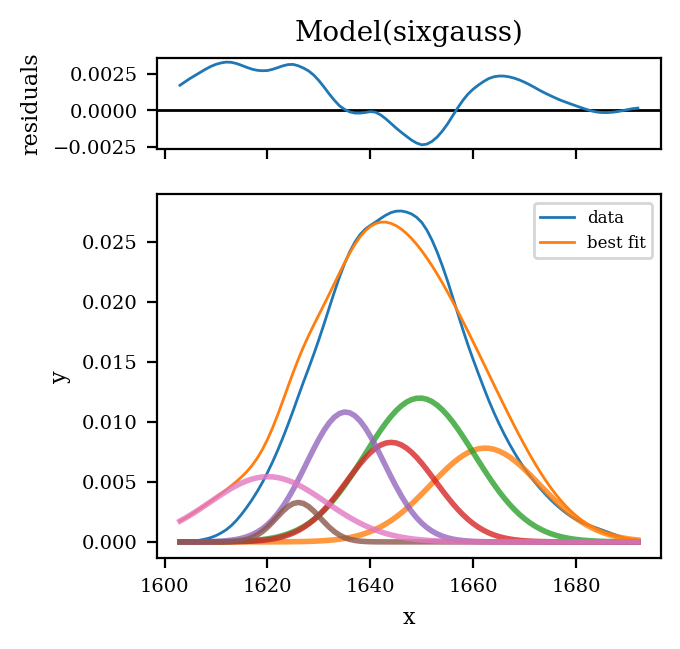

0 m1
1 m2
2 m3
3 m4
4 m5
5 m6
6 s1
7 s2
8 s3
9 s4
10 s5
11 s6
12 a1
13 a2
14 a3
15 a4
16 a5
17 a6
18 __lnsigma


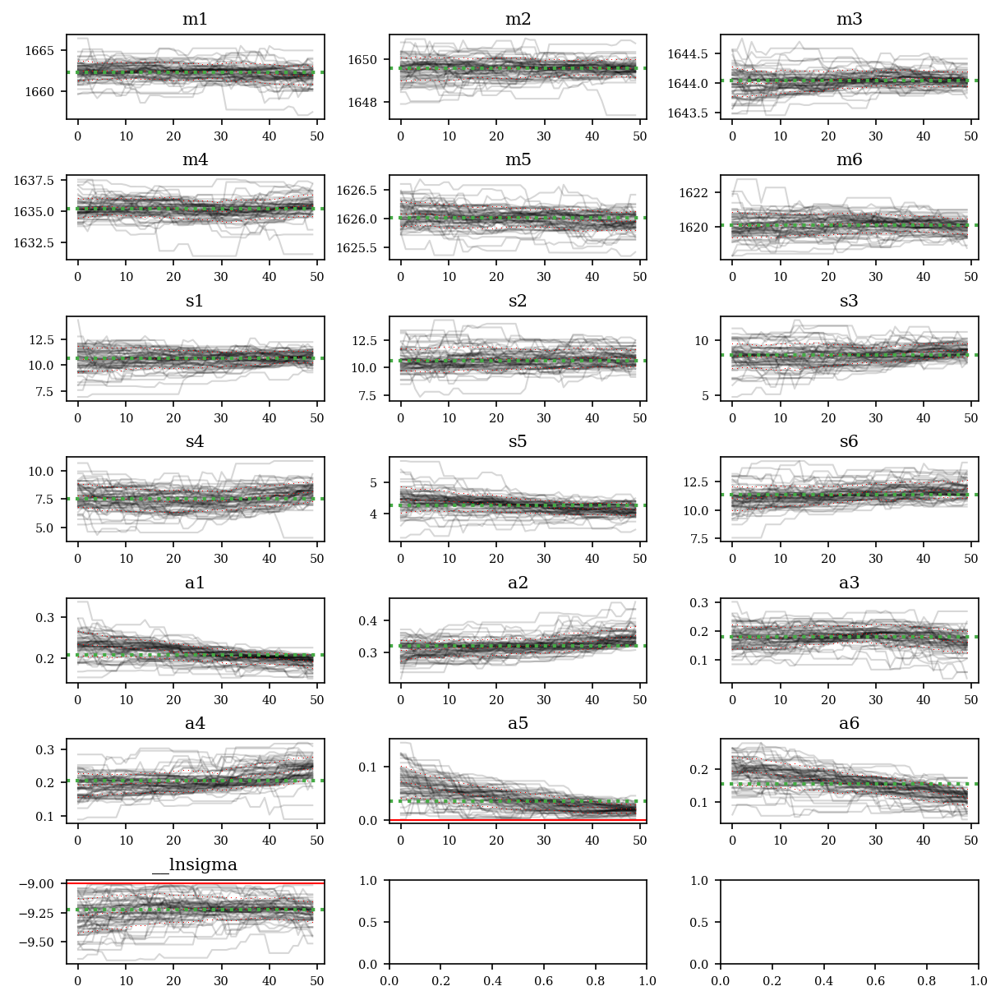

(64, 19) 64 19
Sat Jun 21 15:21:42 2025
s = 3


100%|█████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:00<00:00, 420.32it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 19 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 2;
tau: [10.82225216 10.68810271 10.46056688 10.21235198  9.73943222 12.23452936
 10.73473348  9.98287159 10.78803415 11.01961842 11.55093446 11.00227716
 11.49307271 10.94888591 10.51172633 11.78854833 12.19857823 13.11119882
 11.70214342]
after 6400 evaluations:
which took  0m  0.3s
which is 24825.0 fev/sec


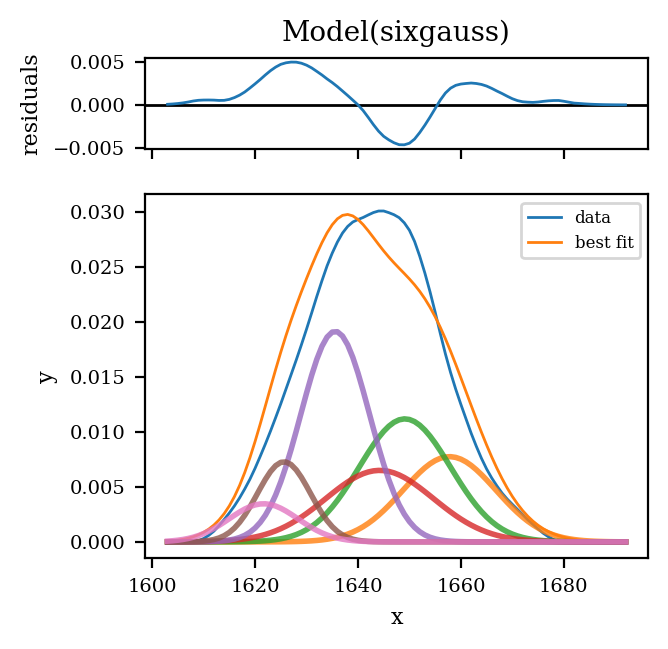

0 m1
1 m2
2 m3
3 m4
4 m5
5 m6
6 s1
7 s2
8 s3
9 s4
10 s5
11 s6
12 a1
13 a2
14 a3
15 a4
16 a5
17 a6
18 __lnsigma


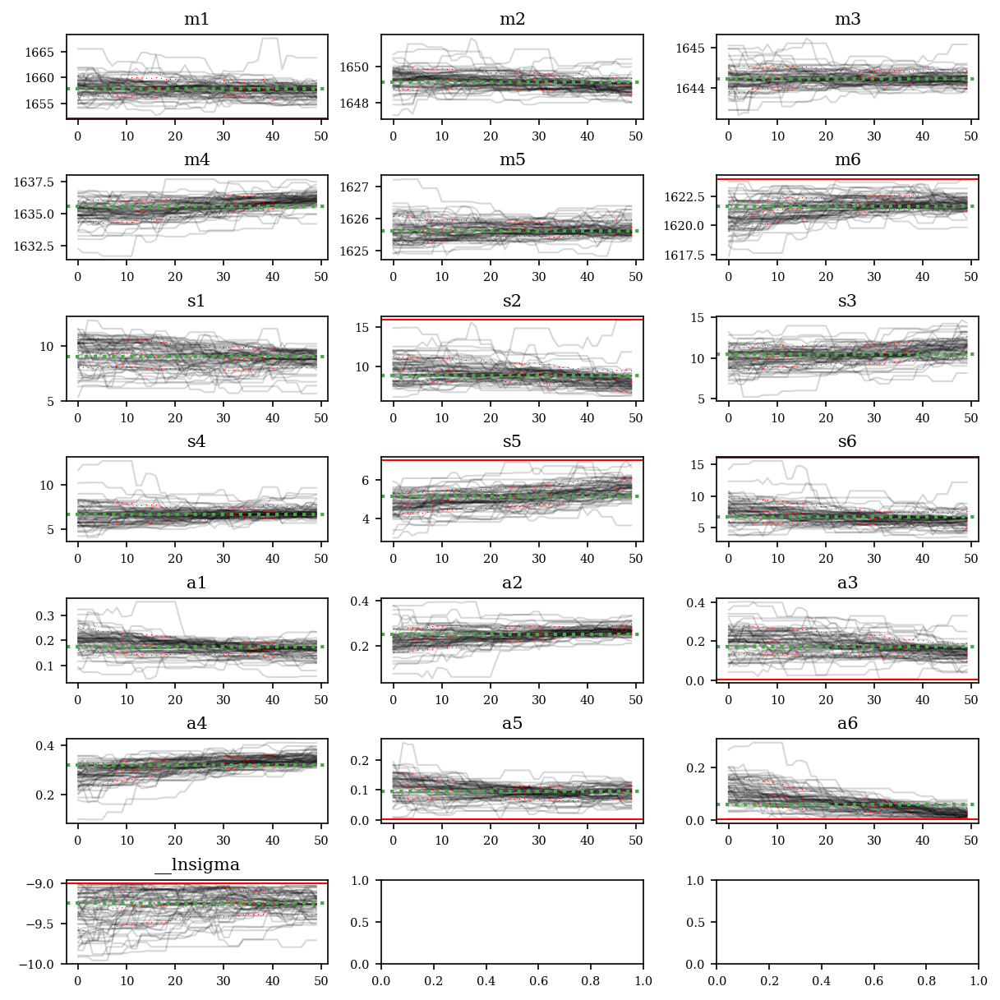

In [25]:
# systems = ['PSM-25', 'PSM-50', 'PSM-75', 'PSM-100']
first, last = 30, 120

method= 'emcee'
max_nfev = 1_000_000
nwalkers, nsteps = 64, 100 # better values here: 128, 3000
# 1000, 19000: 9m40s       <<<<< log10(1000*19000) = 7.28
# 256, 71000: 10m00s        <<<<< log10(1000*19000) = 7.26
# 50, 360_000 :   <<<<< ... = 7.26
burn = int(nsteps*0.5)
thin = int(nsteps/500+1) # 2000 # 10
is_weighted = False
initialmethod='uniform'
print('nwalkers', nwalkers, '\nnsteps', nsteps)

sixgauss_pars = sixgauss_model.make_params()
mmax = 1680

sixgauss_pars.add('m1', min=1652, max=1670, value=1659.6)
sixgauss_pars.add('m2', min=1647, max=1652, value=1650)
sixgauss_pars.add('m3', min=1642, max=1646, value=1645)
sixgauss_pars.add('m4', min=1631, max=1639, value=1635)
sixgauss_pars.add('m5', min=1624, max=1628, value=1625)
sixgauss_pars.add('m6', min=1615, max=1624, value=1620)


smax = 16
smin = 1.5
sixgauss_pars.add('s1', min=smin, max=smax, value=9.5)
sixgauss_pars.add('s2', min=smin, max=smax, value=7.5)
sixgauss_pars.add('s3', min=smin, max=smax, value=10)
sixgauss_pars.add('s4', min=smin, max=smax, value=5.7)
sixgauss_pars.add('s5', min=smin, max=7, value=3.8)
sixgauss_pars.add('s6', min=smin, max=smax, value=5.2)

# themargin = 7 # 1.3 multiply by 1.2 each time?
# amax = 1
# a_ = 0.116
# sixgauss_pars.add('a1', min=margin(a_, 1/themargin), max=margin(a_, themargin), value=a_)
# a_ = 0.102
# sixgauss_pars.add('a2', min=margin(a_, 1/themargin)/2, max=margin(a_, themargin), value=a_) # shaping
# a_ = 0.318
# sixgauss_pars.add('a3', min=margin(a_, 1/themargin), max=margin(a_, themargin), value=a_)
# a_ = 0.281
# sixgauss_pars.add('a4', min=margin(a_, 1/themargin), max=margin(a_, themargin), value=a_)
# a_ = 0.100
# sixgauss_pars.add('a5', min=margin(a_, 1/themargin), max=margin(a_, themargin), value=a_)
# a_ = 0.084
# sixgauss_pars.add('a6', min=margin(a_, 1/themargin), max=margin(a_, themargin), value=a_)

amin=0.001
amax=0.50

sixgauss_pars.add('a1', min=amin, max=amax, value=0.197)
sixgauss_pars.add('a2', min=amin, max=amax, value=0.158)
sixgauss_pars.add('a3', min=amin, max=amax, value=0.298)
sixgauss_pars.add('a4', min=amin, max=amax, value=0.225)
sixgauss_pars.add('a5', min=amin, max=amax, value=0.027)
sixgauss_pars.add('a6', min=amin, max=amax, value=0.095)


if method == 'emcee':
    if not is_weighted:
        sixgauss_pars.add('__lnsigma', min = -12, max = -9, value=-10)

allmins = []
allmaxs = []
for val in sixgauss_pars.valuesdict().keys():
    allmins.append(sixgauss_pars[val].min)
    allmaxs.append(sixgauss_pars[val].max)

print('method:', method)

print('>>>\t6sixgauss,\t1k basinhopping steps: 1.5s')
print('>>>>\t6sixgauss,\t10k basinhopping steps: 14 - 15s')
print('>>>>>\t6sixgauss,\t100k basinhopping steps: 2m24 - 2m30 (144-150s)')
print('>>>>>>\t6sixgauss,\t1M basinhopping steps: 27m41s (1661s)\t\tunfinished')
print('>>>>>>\t6sixgauss,\t1M basinhopping steps: 10m40s - 12m10s (640-730s)\tfinished early')

numpars = 0

for i, par in enumerate(sixgauss_pars):
    if sixgauss_pars[par].vary:
        numpars += 1
#     numpars += 1
    print(i, numpars, par)

if method == 'emcee':
    initials = np.zeros((nwalkers, numpars))


try:
    gausses
except:
    gausses = {}

##################################################
systems = ['PSM-100', 'PSM-75', 'PSM-50', 'PSM-25']

for s, system in enumerate(systems):
    # if '100' not in system:
    #     continue
    ##################################################
    # initials
    ##################################################
    use_i = 0
    if method == 'emcee':
        for i, par in enumerate(sixgauss_pars):
            if not sixgauss_pars[par].vary:
                continue
    
            mmin = 1e-10 if (np.isnan(sixgauss_pars[par].min) or np.isinf(sixgauss_pars[par].min)) else sixgauss_pars[par].min
            vval = 1e-9 if (np.isnan(sixgauss_pars[par].value) or np.isinf(sixgauss_pars[par].value)) else sixgauss_pars[par].value
            mmax = 2 if (np.isnan(sixgauss_pars[par].max) or np.isinf(sixgauss_pars[par].max)) else sixgauss_pars[par].max
            
            if initialmethod == 'normal':
                parmean = vval
                parstd = min(mmax - vval, vval-mmin)/2 #/1000
                print(mmin, '{', parmean, parstd, '}', mmax, sep='\t')
                
                initials[:, use_i] = np.random.normal(parmean, parstd, size=nwalkers)
            elif initialmethod == 'uniform':
                initials[:, use_i] = np.random.uniform(mmin, mmax, size=nwalkers)
            use_i += 1
        print(initials.shape, nwalkers, numpars)
        ##################################################
        rechained = True
        try:
            lastframe = np.copy(gausses[f'{system}'].chain[-1, :, :])
        except:
            rechained = False
        if rechained:
            # initials = lastframe
            ####
            initials = np.zeros((nwalkers, len(lastframe[0])))
            print(initials.shape)
            for i in range(initials.shape[-1]):
                initials[:, i] = np.clip(
                    np.random.normal(np.mean(lastframe[:, i]), np.std(lastframe[:, i])/4, nwalkers),
                    allmins[i], allmaxs[i]
                )
        ##################################################
    if method == 'emcee':
        fit_kws={'nwalkers' : nwalkers, 'pos': initials, 'steps': nsteps,
                 'is_weighted': is_weighted, 'burn': burn, 'thin': thin}#, 'max_nfev': 10}
    else:
        fit_kws={}

    
    starttime = time.time()
    print(time.ctime(starttime))
    print('s =', s)
    thishist = fixhist(psm_amide[s, first:last]) # psm_amide[s, first:last]/np.sum(psm_amide[s, first:last])
    
    gausses[f'{system}'] = sixgauss_model.fit(
        thishist, params = sixgauss_pars, method = method, x=psm_freqs[first:last], 
    #     weights = (np.log(tax[first_t:last_t]+2)*0.029)**-2*10,
        # weights = np.ones_like(psm_freqs[first:last])*np.exp(-10.0655)**-1,
        # weights = np.std(e_cor[:, first_t:last_t], axis=0)**-1*np.sqrt(len(e_cor)-1),
        fit_kws = fit_kws, 
        nan_policy='omit',
        max_nfev=max_nfev
    )
    print('after', gausses[f'{system}'].nfev, 'evaluations:')
    endtime = time.time()
    duration = endtime-starttime
    print(f'which took {duration//60:2.0f}m{duration%60:5.1f}s')
    print(f"which is {gausses[f'{system}'].nfev/duration:5.1f} fev/sec")
    gausses[f'{system}'].plot(datafmt='-')

    for i in range(1, 7):
        a = gausses[f'{system}'].best_values[f'a{i}']
        m = gausses[f'{system}'].best_values[f'm{i}']
        s = gausses[f'{system}'].best_values[f's{i}']
        plt.plot(psm_freqs[first:last], onegauss(psm_freqs[first:last], m, s, a), c=f'C{i}', alpha=0.8, lw=2)

    plt.show()


        
    
    ##################################################
    
    if method=='emcee':
    #     emcee_corner = corner.corner(results.flatchain, labels=results.var_names,
    #                              truths=list(results.params.valuesdict().values()))
    #             results.chain.shape
        plt.subplots((numpars+2)//3,3,figsize=(8,8), dpi=150, constrained_layout=True)
        ii = 0
        for i, par in enumerate(sixgauss_pars):
            print(i,par)
            if sixgauss_pars[par].vary:
    
                plt.subplot((numpars+2)//3, 3, ii+1)
    
                ys = gausses[f'{system}'].chain[:, :, ii]

                plt.plot(ys, 'k', alpha = 10/nwalkers)
                m = np.mean(ys, axis=1)
                plt.plot(m, 'r,')
                s = np.std(ys, axis=1)
                plt.plot(m+s, 'r,')
                plt.plot(m-s, 'r,')
                ylims = plt.ylim()
                plt.axhline(gausses[f'{system}'].params[par].min, c='r')
                plt.axhline(gausses[f'{system}'].params[par].max, c='r')
                plt.axhline(gausses[f'{system}'].params[par].value, c='#44aa44', ls=':', lw=2)
                plt.ylim(ylims)
                plt.title(par)
    
                ii+=1
        plt.show()

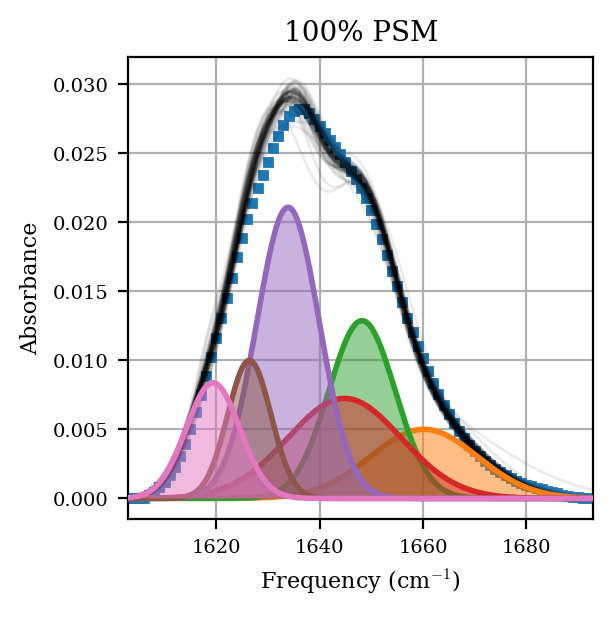

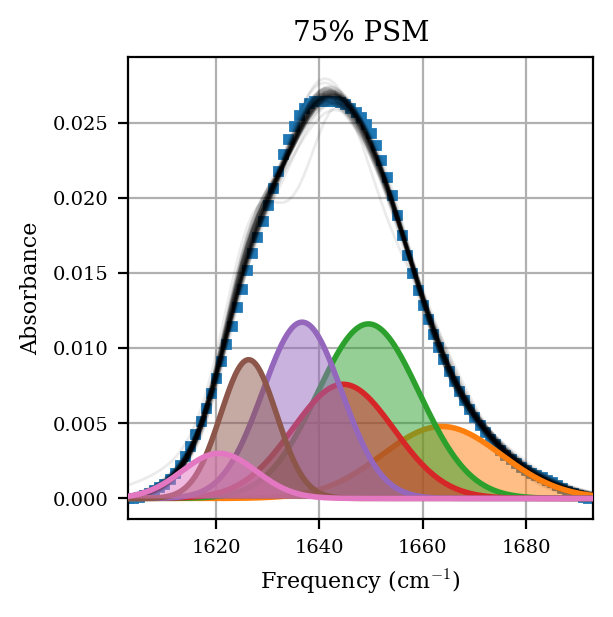

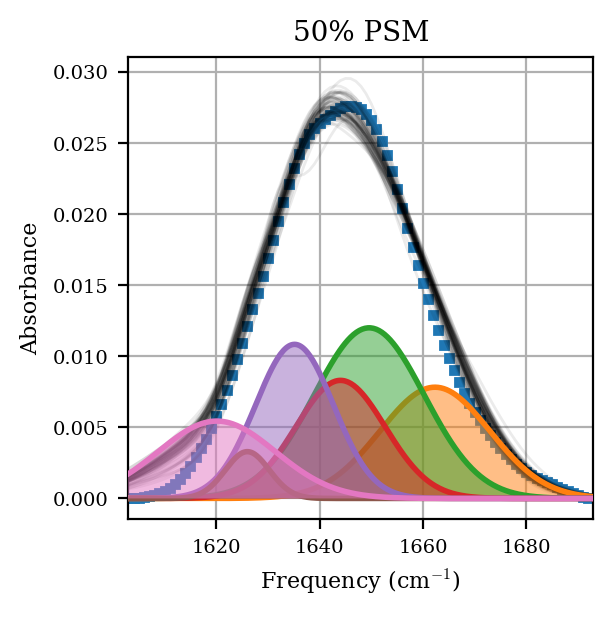

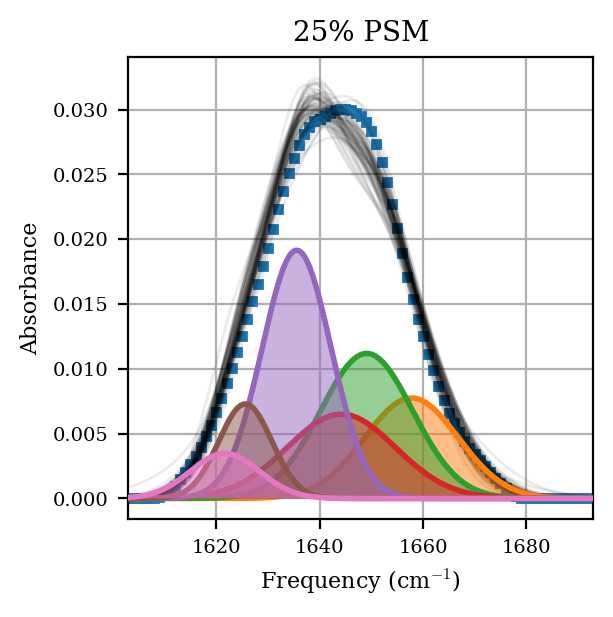

In [26]:
# gausses all peaks
systitles = ['100% PSM', '75% PSM', '50% PSM', '25% PSM']
nwalkers = gausses[f'{system}'].chain.shape[1]
for ss, system in enumerate(systems):
    # if '100' not in system:
    #     continue
    plt.figure(figsize=(3,3))

    plt.plot(psm_freqs[first:last], gausses[f'{system}'].data, 's', ms=3)

    plt.xlim(psm_freqs[first], psm_freqs[last])
    # plt.ylim(-0.01, 0.01)
    x_ = np.linspace(np.min(psm_freqs), np.max(psm_freqs), 500)
    for i in range(1, 7):
        a = gausses[f'{system}'].best_values[f'a{i}']
        m = gausses[f'{system}'].best_values[f'm{i}']
        s = gausses[f'{system}'].best_values[f's{i}']
        y = onegauss(x_, m, s, a)
        plt.fill_between(x_, y, np.zeros_like(y), color=f'C{i}', alpha=0.5, lw=0, 
                         zorder = 100+np.array([0,1,2,3,4,5,6])[i])
        plt.plot(x_, y, color=f'C{i}', alpha=1, lw=2, 
                         zorder = 100.1+np.array([0,1,2,3,4,5,6])[i])
    if method == 'emcee':
        for j in range(nwalkers):
            c='k'

            plt.plot(psm_freqs, sixgauss(psm_freqs, 
                                         *gausses[f'{system}'].chain[-1, j, :-1]), c=c, alpha=5/nwalkers)

            
    # plt.yscale('log')
    # plt.ylim(1e-1, 1e2)
    # plt.ylim(0, 0.032)
    plt.grid(True)
    plt.xlabel('Frequency (cm$^{-1}$)')
    plt.ylabel('Absorbance')
    plt.title(systitles[ss])
    # plt.gca().set_yticklabels([])
    # plt.savefig(f'/Users/shea/Downloads/sixgauss-{system}-fromgausses')

    # for freq_ in [1740, 1739, 1742, 1725, 1725, 1727, 1710, 1712]:
    #     plt.axvline(freq_, lw=0.7, c='k')
    plt.show()
    # print(system, gausses[f'{system}'].params['s1'].value, 
    #       gausses[f'{system}'].params['s2'].value)

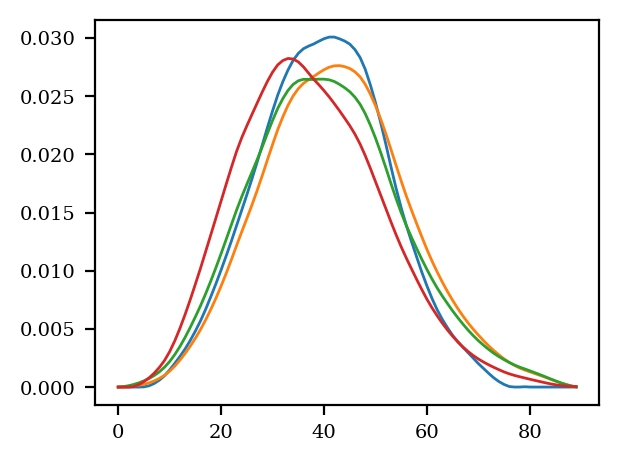

In [27]:
plt.plot(gausses['PSM-25'].data)
plt.plot(gausses['PSM-50'].data)
plt.plot(gausses['PSM-75'].data)
plt.plot(gausses['PSM-100'].data)

In [28]:
thevals = gausses['PSM-75'].best_values
print('NH: 1-2\t', thevals['m1'] - thevals['m2'])
print('NH: 3-4\t', thevals['m3'] - thevals['m4'])
print('NH: 5-6\t', thevals['m5'] - thevals['m6'])
print()
print('CO: 1-3\t', thevals['m1'] - thevals['m3'])
print('CO: 2-4\t', thevals['m2'] - thevals['m4'])
print('CO: 3-5\t', thevals['m3'] - thevals['m5'])
print('CO: 4-6\t', thevals['m4'] - thevals['m6'])

NH: 1-2	 14.1864698978236
NH: 3-4	 7.935137921751675
NH: 5-6	 5.720412181913844

CO: 1-3	 19.07299075953597
CO: 2-4	 12.821658783464045
CO: 3-5	 18.29949785520239
CO: 4-6	 16.084772115364558


In [30]:
thevals = gausses['PSM-75'].best_values
print('NH: 1-2\t', f"{thevals['m1'] - thevals['m2']:5.1f}")
print('NH: 3-4\t', f"{thevals['m3'] - thevals['m4']:5.1f}")
print('NH: 5-6\t', f"{thevals['m5'] - thevals['m6']:5.1f}")
print()
print('CO: 1-3\t', f"{thevals['m1'] - thevals['m3']:5.1f}")
print('CO: 2-4\t', f"{thevals['m2'] - thevals['m4']:5.1f}")
print('CO: 3-5\t', f"{thevals['m3'] - thevals['m5']:5.1f}")
print('CO: 4-6\t', f"{thevals['m4'] - thevals['m6']:5.1f}")
print()
print('2CO, 1NH1CO', f"{thevals['m5']:5.1f}, {thevals['m4']:5.1f}")

NH: 1-2	  14.2
NH: 3-4	   7.9
NH: 5-6	   5.7

CO: 1-3	  19.1
CO: 2-4	  12.8
CO: 3-5	  18.3
CO: 4-6	  16.1

2CO, 1NH1CO 1626.3, 1636.7


In [31]:
print(f'{thevals["m1"]:5.1f}\t{thevals["m2"]:5.1f}')
print(f'{thevals["m3"]:5.1f}\t{thevals["m4"]:5.1f}')
print(f'{thevals["m5"]:5.1f}\t{thevals["m6"]:5.1f}')

1663.7	1649.5
1644.6	1636.7
1626.3	1620.6


In [32]:
tota = 0
for a in range(6):
    tota += thevals[f'a{a+1}']
print(f'{thevals["a1"]/tota:5.3f}\t{thevals["a2"]/tota:5.3f}')
print(f'{thevals["a3"]/tota:5.3f}\t{thevals["a4"]/tota:5.3f}')
print(f'{thevals["a5"]/tota:5.3f}\t{thevals["a6"]/tota:5.3f}')

0.137	0.282
0.184	0.221
0.123	0.053


In [33]:
print(f'{thevals["s1"]:5.1f}\t{thevals["s2"]:5.1f}')
print(f'{thevals["s3"]:5.1f}\t{thevals["s4"]:5.1f}')
print(f'{thevals["s5"]:5.1f}\t{thevals["s6"]:5.1f}')

 11.6	  9.8
  9.8	  7.6
  5.4	  7.2


In [37]:
try: best_ns;
except: best_ns = {};
first, last = 30, 120

for system in systems:
    yobs = gausses[f'{system}'].data
    print(gausses[f'{system}'])
    best = np.inf
    bestn = 0
    bests = 0
    print(np.sum((gausses[f'{system}'].data-gausses[f'{system}'].best_fit)**2))
    print(gausses[f'{system}'].redchi)
    for n in range(nwalkers):
        print(f'> {n}/{nwalkers}', end=' ')
        for s in range(len(gausses[f'{system}'].chain)):
            yfit = sixgauss(psm_freqs[first:last], *gausses[f'{system}'].chain[s, n, :-1])
            this = np.sum((yobs-yfit)**2)/(np.exp(-10.0655))**2#/len(gausses[f'{system}'].var_names)
            if this < best:
                bestn = n
                bests = s
                best = this
                print(n, s, f"{best:5.2e}")
    print('done')
    best_ns[system] = [bestn, bests]

0.00020686151051103958
443.5067067228341
> 0/64 0 0 1.38e+06
0 5 1.25e+06
0 6 7.45e+05
0 26 4.23e+05
0 27 2.69e+05
0 30 2.38e+05
0 32 1.97e+05
0 34 1.66e+05
0 35 1.62e+05
0 36 1.44e+05
0 38 7.75e+04
0 43 6.52e+04
0 44 5.78e+04
0 47 5.30e+04
0 49 4.80e+04
> 1/64 1 39 4.74e+04
1 40 4.15e+04
1 43 4.07e+04
1 45 3.89e+04
1 48 3.49e+04
> 2/64 2 26 3.27e+04
2 27 2.12e+04
2 36 2.11e+04
2 40 2.09e+04
> 3/64 > 4/64 > 5/64 > 6/64 > 7/64 > 8/64 > 9/64 > 10/64 > 11/64 > 12/64 > 13/64 > 14/64 > 15/64 15 42 1.91e+04
> 16/64 > 17/64 > 18/64 > 19/64 > 20/64 > 21/64 > 22/64 > 23/64 > 24/64 > 25/64 > 26/64 > 27/64 > 28/64 > 29/64 > 30/64 > 31/64 > 32/64 > 33/64 > 34/64 > 35/64 > 36/64 > 37/64 > 38/64 > 39/64 > 40/64 > 41/64 > 42/64 > 43/64 > 44/64 > 45/64 > 46/64 > 47/64 > 48/64 > 49/64 > 50/64 > 51/64 > 52/64 > 53/64 > 54/64 > 55/64 > 56/64 > 57/64 > 58/64 > 59/64 > 60/64 > 61/64 > 62/64 > 63/64 done
7.987452059388472e-05
149.14065102592303
> 0/64 0 0 3.51e+05
0 3 2.38e+05
0 4 1.80e+05
0 16 1.27e+05
0 2

In [38]:
print(f'\n-----{bestn}\t{bests}\t{best}\tdone-----\n\n')
print(best_ns)


-----9	48	22467.243179367866	done-----


{'PSM-100': [15, 42], 'PSM-75': [48, 37], 'PSM-50': [18, 48], 'PSM-25': [9, 48]}


In [41]:
for name, val in zip(gausses[f'PSM-25'].var_names, gausses[f'PSM-25'].chain[best_ns['PSM-25'][1], best_ns['PSM-25'][0]]):
    print(name, val)

m1 1656.0351580765312
m2 1648.915186103377
m3 1644.4762981987155
m4 1636.0384372814972
m5 1626.3885584433367
m6 1622.1413312668549
s1 8.507788629819203
s2 7.7148571903593695
s3 13.162727075910782
s4 7.758481498770717
s5 5.650637406065189
s6 7.81789854306918
a1 0.1404673765303507
a2 0.3128867961840499
a3 0.11535821915160933
a4 0.375381628302971
a5 0.047737665889842074
a6 0.009329612660852034
__lnsigma -9.412168124806445


(4, 3)
[ 0.     13.1004 32.4076] [0.         2.66654672 1.96993426]


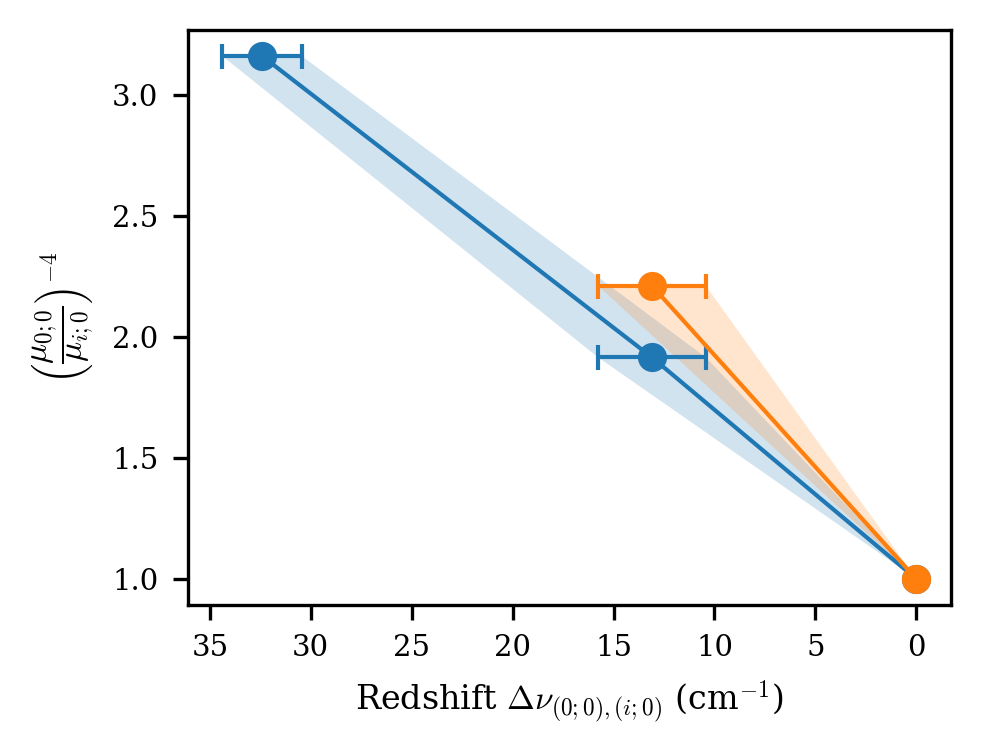

In [58]:
ac1 = np.array([1, 1, 0.85, 0.85, 0.75, 0.75])**-2
ac2 = np.array([1, 1, 0.82, 0.82, np.nan, np.nan])**-2

xx0 = np.array([1658.2587,	1649.2020,	1645.3190,	1635.6785,	1624.8007,	1617.2545])
xx0 = np.abs(xx0 - xx0[0])

xx1 = np.array([1660.9496,	1649.7474,	1645.3211,	1634.7028,	1626.6364,	1622.0322])
xx1 = np.abs(xx1 - xx1[0])

xx2 = np.array([1658.8819,	1648.9818,	1643.8650,	1635.3859,	1626.1608,	1620.6904])
xx2 = np.abs(xx2 - xx2[0])

xx3 = np.array([1654.4265,	1647.2360,	1645.6100,	1634.1879,	1625.2884,	1618.5875])
xx3 = np.abs(xx3 - xx3[0])




plt.figure(figsize=(3.25, 2.5), dpi=300)


p=2
ll = np.array([xx0[::2], xx1[::2], xx2[::2], xx3[::2]])
print(ll.shape)
mm = np.mean(ll, axis=0)
ss = np.std(ll, axis=0)
print(mm, ss)
plt.errorbar(x=mm, y=ac1[::2]**p, xerr = ss, marker='o', capsize=3)
plt.errorbar(x=mm, y=ac2[::2]**p, xerr=ss, marker='o', capsize=3)

plt.fill_betweenx(ac1[::2]**p, mm-ss, mm+ss, zorder=-10, alpha=0.2)
plt.fill_betweenx(ac2[::2]**p, mm-ss, mm+ss, zorder=-10, alpha=0.2)

plt.xlabel('Redshift $\Delta\\nu_{(0;0),(i;0)}$ (cm$^{-1}$)')

plt.ylabel('$\left( \dfrac{\\mu_{0;0}}{\\mu_{i;0}} \\right)^{-4}$')
plt.gca().invert_xaxis()
plt.tight_layout()
if saving:
    plt.savefig('/Users/shea/dcuments/research/psm-2dir/figures/mu-vs-redshift.svg')
    
    
    output_file = '/Users/shea/dcuments/research/psm-2dir/figures/mu-vs-redshift.csv'
    with open(output_file, 'w', newline='') as csvfile:
        writer = csv.writer(csvfile)
        # Write header
        writer.writerow(['name', 'zero', '1hbond', '2hbonds'])
        
        # Loop through fractions and write data
        writer.writerow(['redshifts', *mm])
        writer.writerow(['redshifterror', *ss])
        writer.writerow(['Ghosh', *(ac1[::2]**p)])
        writer.writerow(['Baiz', *(ac2[::2]**p)])
        

## important equation:
$c = f^{-2}$ and $y = c^2 = α*r+1$

In [45]:
m1, m2, m3, m4, m5, m6, s1, s2, s3, s4, s5, s6, a1, a2, a3, a4, a5, a6, \
__lnsigma = gausses[f'PSM-25'].chain[best_ns['PSM-25'][1], best_ns['PSM-25'][0]]
print('m:', ",\t".join(f"{x:9.4f}" for x in [m1, m2, m3, m4, m5, m6]))
print('s:', "\t".join(f"{x:9.4f}" for x in [s1, s2, s3, s4, s5, s6]))
print("a:", "\t".join(f"{x:9.4f}" for x in [a1, a2, a3, a4, a5, a6]))

m: 1656.0352,	1648.9152,	1644.4763,	1636.0384,	1626.3886,	1622.1413
s:    8.5078	   7.7149	  13.1627	   7.7585	   5.6506	   7.8179
a:    0.1405	   0.3129	   0.1154	   0.3754	   0.0477	   0.0093


In [46]:
m1, m2, m3, m4, m5, m6, s1, s2, s3, s4, s5, s6, a1, a2, a3, a4, a5, a6, \
__lnsigma = gausses[f'PSM-50'].chain[best_ns['PSM-50'][1], best_ns['PSM-50'][0]]
print('m:', ",\t".join(f"{x:9.4f}" for x in [m1, m2, m3, m4, m5, m6]))
print('s:', "\t".join(f"{x:9.4f}" for x in [s1, s2, s3, s4, s5, s6]))
print("a:", "\t".join(f"{x:9.4f}" for x in [a1, a2, a3, a4, a5, a6]))

m: 1663.9022,	1649.7115,	1644.3093,	1635.6593,	1626.2395,	1618.9040
s:    9.2698	   9.4162	   8.4719	   7.9672	   4.0335	  11.0643
a:    0.1573	   0.3637	   0.1586	   0.2572	   0.0454	   0.0572


In [48]:
m1, m2, m3, m4, m5, m6, s1, s2, s3, s4, s5, s6, a1, a2, a3, a4, a5, a6, \
__lnsigma = gausses[f'PSM-75'].chain[best_ns['PSM-75'][1], best_ns['PSM-75'][0]]
print('m:', ",\t".join(f"{x:9.4f}" for x in [m1, m2, m3, m4, m5, m6]))
print('s:', "\t".join(f"{x:9.4f}" for x in [s1, s2, s3, s4, s5, s6]))
print("a:", "\t".join(f"{x:9.4f}" for x in [a1, a2, a3, a4, a5, a6]))

m: 1665.1025,	1649.0751,	1645.2555,	1636.3573,	1626.2487,	1621.0449
s:   12.5167	   8.8790	   9.5713	   6.5916	   5.6185	   6.5956
a:    0.1441	   0.3378	   0.1339	   0.2307	   0.1035	   0.0570


In [52]:
m1, m2, m3, m4, m5, m6, s1, s2, s3, s4, s5, s6, a1, a2, a3, a4, a5, a6, \
__lnsigma = gausses[f'PSM-100'].chain[best_ns['PSM-100'][1], best_ns['PSM-100'][0]]
print('m:', ",\t".join(f"{x:9.4f}" for x in [m1, m2, m3, m4, m5, m6]))
print('s:', "\t".join(f"{x:9.4f}" for x in [s1, s2, s3, s4, s5, s6]))
alist = [a1, a2, a3, a4, a5, a6]
print("a:", "\t".join(f"{x/np.sum(alist):9.4f}" for x in alist))

m: 1657.9686,	1648.1870,	1645.1782,	1633.4696,	1626.7862,	1621.3186
s:   12.3140	   6.7545	  14.4345	   7.0573	   3.8335	   5.9714
a:    0.1130	   0.2133	   0.2009	   0.3453	   0.0157	   0.1117


This next block i did manually... which was not at all necessary.

"percs" refer to the relative amplitudes of the gaussians found from the fits (the "a1, a2..." values)

"simpercs" were the hbond counts from simulation for each of the 6 bonding "states"?

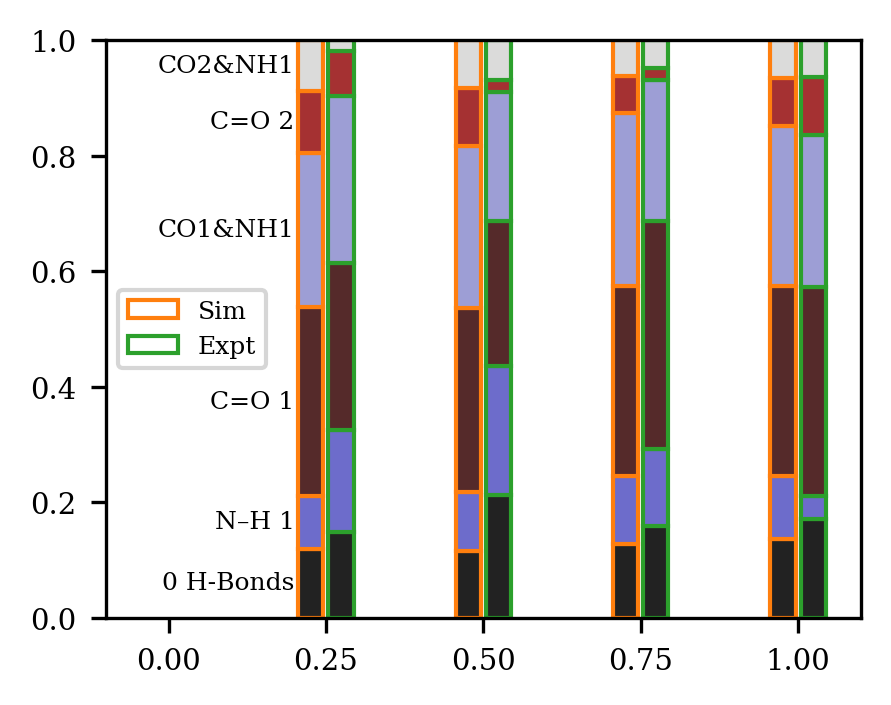

In [59]:
percs = {}
percs['PSM-25'] = np.array([0.1508, 0.1782, 0.2924, 0.2928, 0.0791, 0.0179])
percs['PSM-50'] = np.array([0.2189, 0.2311, 0.2588, 0.2304, 0.0222, 0.0703])
percs['PSM-75'] = np.array([0.1639, 0.1368, 0.4080, 0.2508, 0.0215, 0.0492])
percs['PSM-100']= np.array([0.1738, 0.0419, 0.3669, 0.2687, 0.1026, 0.0645])
simpercs = {}
simpercs['PSM-25'] = np.array([0.120, 0.091, 0.327, 0.267, 0.107, 0.089])
simpercs['PSM-50'] = np.array([0.116, 0.102, 0.318, 0.281, 0.100, 0.084])
simpercs['PSM-75'] = np.array([0.127, 0.118, 0.330, 0.299, 0.065, 0.061])
simpercs['PSM-100'] = np.array([0.137, 0.108, 0.329, 0.278, 0.083, 0.065])

for thing in percs:
    percs[thing] /= np.sum(percs[thing])
thecolors = ['#222222', '#6d6ccb', '#552a2a', '#9d9ed5', '#a53132', '#dbdbda']
labels = ['0 H-Bonds', 'N–H 1', 'C=O 1', 'CO1&NH1', 'C=O 2', 'CO2&NH1']

width=0.08
space = 0.004

plt.figure(figsize=(3.25, 2.5), dpi=300)
for frac in ['25', '50', '75', '100']:
    if f'PSM-{frac}' not in percs:
        continue
    bottom = 0
    
    for i, perc in enumerate(percs[f'PSM-{frac}']):
        
        plt.gca().add_patch(
            mpl.patches.Rectangle([int(frac)/100+space, bottom], width/2, perc, 
                                  facecolor=thecolors[i], edgecolor='C2'))
        bottom += perc

for frac in ['25', '50', '75', '100']:
    if f'PSM-{frac}' not in simpercs:
        continue   
    bottom=0
    for i, perc in enumerate(simpercs[f'PSM-{frac}']):
        # print(type(frac), type(int(frac)), type(space), type(int(frac)/100+space), type(width))
        plt.gca().add_patch(
            mpl.patches.Rectangle([int(frac)/100-width/2-space, bottom], width/2, perc, 
                                  facecolor=thecolors[i], edgecolor='C1'))
        if frac == '25':
            plt.text(0.20, bottom+perc/2, s = labels[i], ha='right', va='center')
        bottom += perc
    


legend_elements = [
    # mpl.patches.Patch(facecolor='#222222', label='0 H-bonds'),
    # mpl.patches.Patch(facecolor='#6d6ccb', label='N-H 1'),
    # mpl.patches.Patch(facecolor='#552a2a', label='C=O 1'),
    # mpl.patches.Patch(facecolor='#9d9ed5', label='CO1&NH1'),
    # mpl.patches.Patch(facecolor='#a53132', label='C=O 2'),
    # mpl.patches.Patch(facecolor='#dbdbda', label='CO2&NH1'),
    mpl.patches.Patch(facecolor='none', edgecolor='C1', label='Sim'),
    mpl.patches.Patch(facecolor='none', edgecolor='C2', label='Expt'),
]

plt.ylim(0,1)
plt.xticks(np.arange(0,1.1, 0.25))
plt.xlim(-0.1, 1.1)
plt.legend(handles=legend_elements)
if saving:
    plt.savefig('/Users/shea/dcuments/research/psm-2dir/figures/perc-ratios.svg')
plt.show()

In [60]:
if saving:
    output_file = '/Users/shea/dcuments/research/psm-2dir/figures/perc-ratios.csv'
    with open(output_file, 'w', newline='') as csvfile:
        writer = csv.writer(csvfile)
        # Write header
        writer.writerow(['Fraction', 'Bond State', 'Experimental', 'Simulated'])
        
        # Loop through fractions and write data
        for frac in ['25', '50', '75', '100']:
            if f'PSM-{frac}' not in percs or f'PSM-{frac}' not in simpercs:
                continue
            
            # Write rows for each bond state
            for i, label in enumerate(labels):
                writer.writerow([
                    f'PSM-{frac}',  # Fraction
                    label,          # Bond State
                    percs[f'PSM-{frac}'][i],  # Experimental Value
                    simpercs[f'PSM-{frac}'][i]  # Simulated Value
                ])

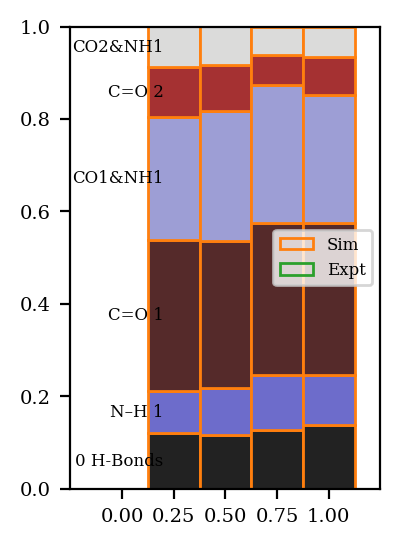

In [61]:
plt.figure(figsize=(2, 3))
width=0.25
for frac in ['25', '50', '75', '100']:
    if f'PSM-{frac}' not in simpercs:
        continue   
    # bottom=-np.cumsum(simpercs[f'PSM-{frac}'])[3]
    bottom = 0
    for i, perc in enumerate(simpercs[f'PSM-{frac}']):
        plt.gca().add_patch(
            mpl.patches.Rectangle([int(frac)/100-width/2, bottom], width, perc, 
                                  facecolor=thecolors[i], edgecolor='C1'))
        if frac == '25':
            plt.text(0.20, bottom+perc/2, s = labels[i], ha='right', va='center')
        bottom += perc
    


legend_elements = [
    # mpl.patches.Patch(facecolor='#222222', label='0 H-bonds'),
    # mpl.patches.Patch(facecolor='#6d6ccb', label='N-H 1'),
    # mpl.patches.Patch(facecolor='#552a2a', label='C=O 1'),
    # mpl.patches.Patch(facecolor='#9d9ed5', label='CO1&NH1'),
    # mpl.patches.Patch(facecolor='#a53132', label='C=O 2'),
    # mpl.patches.Patch(facecolor='#dbdbda', label='CO2&NH1'),
    mpl.patches.Patch(facecolor='none', edgecolor='C1', label='Sim'),
    mpl.patches.Patch(facecolor='none', edgecolor='C2', label='Expt'),
]

plt.ylim(0,1)
plt.xticks(np.arange(0,1.1,0.25))
plt.xlim(-0.25, 1.25)
plt.legend(handles=legend_elements)
plt.axhline(0, c='k')
if saving:
    plt.savefig('/Users/shea/Downloads/simperc-ratios')
plt.show()

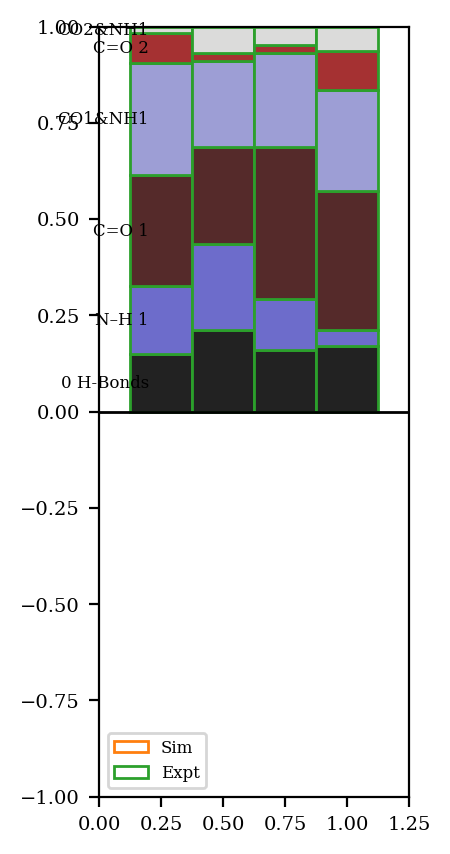

In [62]:
plt.figure(figsize=(2, 5))
width=0.25
for frac in ['25', '50', '75', '100']:
    if f'PSM-{frac}' not in percs:
        continue   
    # bottom=-np.cumsum(percs[f'PSM-{frac}'])[2]
    bottom = 0
    for i, perc in enumerate(percs[f'PSM-{frac}']):
        plt.gca().add_patch(
            mpl.patches.Rectangle([int(frac)/100-width/2, bottom], width, perc, 
                                  facecolor=thecolors[i], edgecolor='C2'))
        if frac == '25':
            plt.text(0.20, bottom+perc/2, s = labels[i], ha='right', va='center')
        bottom += perc
    


legend_elements = [
    # mpl.patches.Patch(facecolor='#222222', label='0 H-bonds'),
    # mpl.patches.Patch(facecolor='#6d6ccb', label='N-H 1'),
    # mpl.patches.Patch(facecolor='#552a2a', label='C=O 1'),
    # mpl.patches.Patch(facecolor='#9d9ed5', label='CO1&NH1'),
    # mpl.patches.Patch(facecolor='#a53132', label='C=O 2'),
    # mpl.patches.Patch(facecolor='#dbdbda', label='CO2&NH1'),
    mpl.patches.Patch(facecolor='none', edgecolor='C1', label='Sim'),
    mpl.patches.Patch(facecolor='none', edgecolor='C2', label='Expt'),
]

plt.ylim(-1, 1)
plt.xticks(np.arange(0,1.3,0.25))
plt.legend(handles=legend_elements)
plt.axhline(0, c='k')
if saving:
    plt.savefig('/Users/shea/Downloads/exptperc-ratios')
plt.show()

In [63]:
print([f"{thing:4.2f}" for thing in np.array([1, 1, 0.85, 0.85, 0.75, 0.75])**-2])
print([f"{thing:4.2f}" for thing in np.array([1, 1, 0.82, 0.82, 0.75, 0.75])**-2])
print([f"{thing:4.2f}" for thing in np.array([1, 1, 1.27, 1.27, 1.54, 1.54])])

['1.00', '1.00', '1.38', '1.38', '1.78', '1.78']
['1.00', '1.00', '1.49', '1.49', '1.78', '1.78']
['1.00', '1.00', '1.27', '1.27', '1.54', '1.54']


In [64]:
# cutoffs='gro'
cutoffs='mda'
with open(f'/Users/shea/dcuments/research/psm-2dir/hbond-counts/{cutoffs}-carbonyl-totals', 'rb') as f:
    avghbonds = np.load(f)
print(avghbonds)

[[[0.50826828        nan        nan]
  [0.53103592 0.99053049 0.44685742]
  [0.53872591 0.97033835 0.46638072]
  [0.55450591 0.8862585  0.47772601]
  [       nan 0.90806723 0.4508679 ]]

 [[0.01467998        nan        nan]
  [0.01028969 0.03371422 0.02489285]
  [0.01548072 0.03034689 0.01481405]
  [0.01869615 0.01549665 0.01295965]
  [       nan 0.01789385 0.0085616 ]]]


PSM-100
0
1
PSM-75
PSM-50
PSM-25


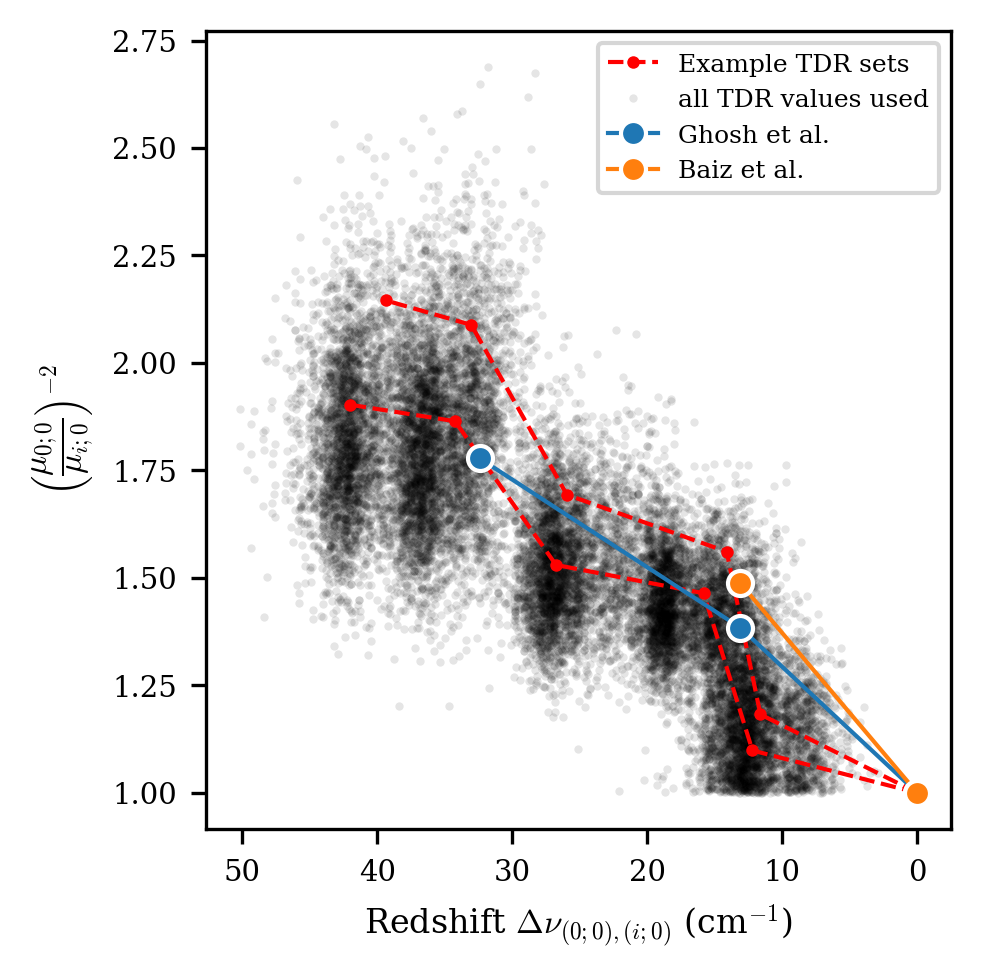

In [96]:
chainshape = gausses[f'{system}'].chain.shape
plt.figure(figsize=(3.25, 3.25), dpi=300)
nsamples = 1000
prelabel1 = ''
prelabel2 = ''
for s, system in enumerate(systems):
    print(system)
    co_samples = np.zeros(nsamples)
    nh_samples = np.zeros(nsamples)
    for sample in range(nsamples):
        rands = np.random.randint(chainshape[0])
        randw = np.random.randint(chainshape[1])
        randchain = gausses[f'{system}'].chain[rands, randw]
        thisr = randchain[0] - randchain[2]

        thisc = np.random.normal(0.835, 0.015*2)
        alp = (thisc**-4 - 1)/thisr
        areacorrection = np.sqrt(1 + alp * (randchain[0]-randchain[:6]))
        nh_factor = np.random.rand()
        areacorrection[1] = areacorrection[0] + (areacorrection[1]-areacorrection[0])*nh_factor
        areacorrection[3] = areacorrection[2] + (areacorrection[3]-areacorrection[2])*nh_factor
        areacorrection[5] = areacorrection[4] + (areacorrection[5]-areacorrection[4])*nh_factor
        if sample < 2 and s == 0:
            print(sample)
            plt.plot((randchain[0]-randchain[:6]), areacorrection, 'ro--', alpha=1, mew=0, ms=3, zorder=1000,
                     label=prelabel1 + 'Example TDR sets')
            prelabel1='_'
        else:
            plt.plot((randchain[0]-randchain[:6]), areacorrection, f'ko', alpha=0.1, mew=0, ms=2, zorder=0,
                    label=prelabel2 + 'all TDR values used')
            prelabel2 = '_'
        



ac1 = np.array([1, 1, 0.85, 0.85, 0.75, 0.75])**-2
# xx = np.abs(np.array([1658, 1650, 1645, 1635, 1626, 1618])-1658.0)
ac2 = np.array([1, 1, 0.82, 0.82, np.nan, np.nan])**-2

plt.plot(mm, ac1[::2], 'o-', zorder=2000, mec='w', mew=1, label = 'Ghosh et al.')
plt.plot(mm, ac2[::2], 'o-', zorder=2000, mec='w', mew=1, label = 'Baiz et al.')
plt.legend()
plt.xlabel('Redshift $\Delta\\nu_{(0;0),(i;0)}$ (cm$^{-1}$)')

plt.ylabel('$\left( \dfrac{\\mu_{0;0}}{\\mu_{i;0}} \\right)^{-2}$')


plt.gca().invert_xaxis()
plt.tight_layout()
if saving:
    plt.savefig('/Users/shea/dcuments/research/psm-2dir/figures/example-tdrs')

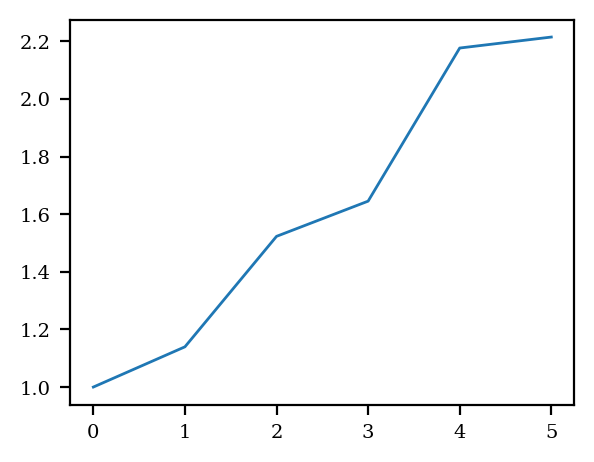

In [82]:
plt.plot(areacorrection)

In [73]:
from netgraph import Graph, get_geometric_layout  # Ensure netgraph is installed
# geopositions = get_geometric_layout(edges, edge_length=edge_length, scale=(50,50),tol=1e-12)

In [74]:
import matplotlib.pyplot as plt
from netgraph import Graph, get_geometric_layout  # Ensure netgraph is installed

# Define edge lengths
edgefactor=2
edge_length = {
    (1, 2): 10.005*edgefactor,
    (3, 4):  9.528*edgefactor,
    (5, 6):  6.335*edgefactor,
    (1, 3): 14.289*edgefactor,
    (2, 4): 13.812*edgefactor,
    (3, 5): 18.577*edgefactor,
    (4, 6): 15.384*edgefactor,
}
edges = list(edge_length.keys())
geopositions = get_geometric_layout(edges, edge_length=edge_length, scale=(50,50),tol=1e-12)

edge_error = {
    (1, 2): 2.246,
    (1, 3): 3.167,
    (3, 4): 1.228,
    (5, 6): 1.134,
    (2, 4): 1.168,
    (3, 5): 1.218,
    (4, 6): 1.777
}

In [75]:
display(edge_length)

{(1, 2): 20.01,
 (3, 4): 19.056,
 (5, 6): 12.67,
 (1, 3): 28.578,
 (2, 4): 27.624,
 (3, 5): 37.154,
 (4, 6): 30.768}

In [76]:
edge_labels = {}

for key in edge_length:
    print(key)
    if key[1] - key[0] == 1:
        change = 'NH'
    else:
        change = 'CO'
    elen = edge_length[key]/edgefactor
    eerr = edge_error[key]
    edge_labels[key] = f'{elen:0.1f}±{eerr:0.1f}'
# = {(1, 2): "10.0\n+NH",
#  (3, 4): "10.5\n+NH",
#  (5, 6): "5.1\n+NH",
#  (1, 3): "14.8\n+CO",
#  (2, 4): "18.0\n+CO",
#  (3, 5): "18.1\n+CO",
#  (4, 6): "12.6\n+CO"}
edge_labels

(1, 2)
(3, 4)
(5, 6)
(1, 3)
(2, 4)
(3, 5)
(4, 6)


{(1, 2): '10.0±2.2',
 (3, 4): '9.5±1.2',
 (5, 6): '6.3±1.1',
 (1, 3): '14.3±3.2',
 (2, 4): '13.8±1.2',
 (3, 5): '18.6±1.2',
 (4, 6): '15.4±1.8'}

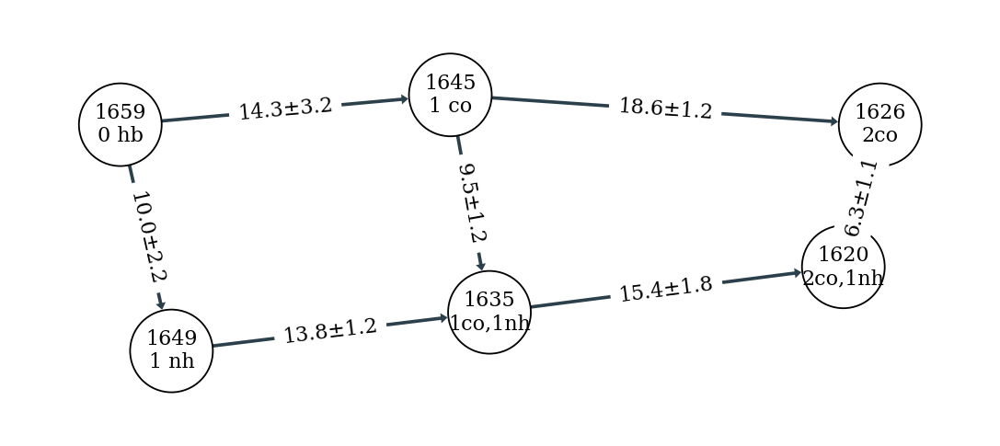

In [77]:
# Create the figure and axes
fig, ax = plt.subplots(dpi=400)
node_labels = {1: "1659\n0 hb", 2: "1649\n1 nh", 3: "1645\n1 co", 4: "1635\n1co,1nh", 
               5: "1626\n2co", 6: "1620\n2co,1nh"}
# Draw the graph
# (edges, edge_length, node_size=0.0, tol=0.001, origin=(0, 0), scale=(1, 1), pad_by=0.05)


gg = Graph(
    edges,
    edge_labels=edge_labels,
    node_labels=node_labels,
    node_color='white',
    node_size=250,
    node_edge_color='k',
    node_edge_width=10,
    node_alpha=1,
    node_label_fontdict={'size': 4},
    edge_label_fontdict={'size': 4},
    node_layout=geopositions,
    ax=ax,
    scale=(50,50),
    edge_width=20,
    edge_alpha=1,
    arrows=True,
    edge_cmap='viridis',
)


# Set equal aspect ratio for proper geometry
# ax.set_aspect('equal')
plt.title("")
plt.show()


In [78]:
percs

{'PSM-25': array([0.14912975, 0.17622627, 0.28916139, 0.28955696, 0.07822389,
        0.01770174]),
 'PSM-50': array([0.21217408, 0.22399922, 0.25084811, 0.22332073, 0.02151788,
        0.06813996]),
 'PSM-75': array([0.15909532, 0.13278975, 0.3960396 , 0.24344787, 0.02086973,
        0.04775772]),
 'PSM-100': array([0.17065986, 0.04114297, 0.36027101, 0.26384525, 0.10074627,
        0.06333464])}

In [79]:
avgpercs = np.zeros(6)
for i in range(6):
    avgpercs[i] = (percs['PSM-25'][i]+percs['PSM-50'][i]+percs['PSM-75'][i]+percs['PSM-100'][i])/4

Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.


['#22222299', '#6d6ccb99', '#552a2a99', '#9d9ed599', '#a5313299', '#dbdbda99']
(15.823584036669779, 34.17641596333022)


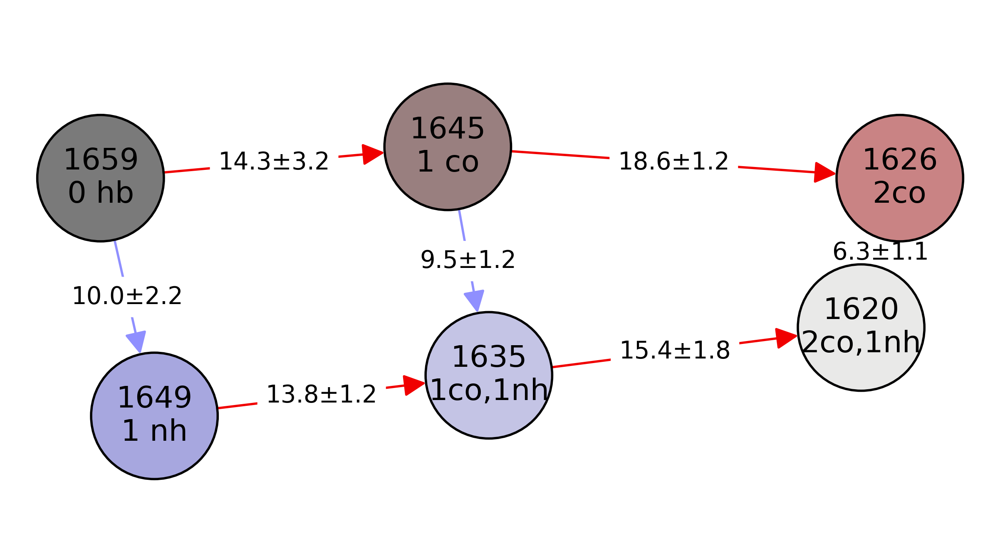

In [80]:
fs = 13
import networkx as nx
G = nx.Graph()
G.add_edges_from(edges)
edge_colors = ['#8F8FFF' if edge[1]-edge[0]==1 else '#f00000' for edge in G.edges()]

# Draw the graph using networkx
plt.figure(figsize=(7.5, 4), dpi=400)

node_colors = thecolors.copy()

for i, color in enumerate(node_colors):
    node_colors[i] = color+'99'
print(node_colors)

# node_size = 15000*avgpercs
node_size = 3000# 2000 < x 
nx.draw_networkx_edges(
    G, pos=geopositions, arrows=True, arrowsize=20,arrowstyle='-|>', edge_color=edge_colors,
    node_size=node_size
)  # Add arrows to edges
nx.draw_networkx_nodes(G, pos=geopositions, node_size=node_size, node_color=node_colors, edgecolors='#000000ff')


pos_labels = {}
for node, (x, y) in geopositions.items():
    pos_labels[node] = (x, y-0)  # Adjust the offset as needed

nx.draw_networkx_labels(G, pos=pos_labels, labels=node_labels, font_size=fs)

# Add edge labels
# edge_labels = {edge: f'{length}' for edge, length in edge_length.items()}  # Format edge lengths as labels
nx.draw_networkx_edge_labels(G, pos=geopositions, edge_labels=edge_labels, font_size=fs*0.8, rotate=False)

# plt.title("Graph with Calculated Positions, Node Labels, and Arrows")
plt.axis('equal')  # Maintain aspect ratio
# plt.gca().invert_xaxis()
# plt.gca().invert_yaxis()
ylims = plt.ylim()
print(ylims)
plt.ylim(ylims[0], ylims[1]+1)
plt.axis('off')
if saving:
    plt.savefig("/Users/shea/dcuments/research/psm-2dir/figures/transition-network.png", bbox_inches='tight', transparent=True)
plt.show()


In [85]:
with open('../cong-data/cong-dppc-stripped.csv', 'rb') as f:
    rawdppc = np.genfromtxt(f, delimiter=',')[:, :2]
print(rawdppc)
congdppc0 = np.zeros([4, 3])
for i in range(4):
    congdppc0[i, 0] = rawdppc[3*i+2, 1]
    congdppc0[i, 1] = rawdppc[3*i, 1]
    congdppc0[i, 2] = rawdppc[3*i+1, 1]
# plt.plot(congdppc0)
congmeans = np.mean(congdppc0, axis=1)
congerrs = (congdppc0[:, 2] - congdppc0[:, 0])/2

[[0.         0.79968214]
 [0.         0.82027972]
 [0.         0.77984743]
 [0.24984539 0.85003179]
 [0.25231911 0.87978385]
 [0.24984539 0.82027972]
 [0.5021645  0.89961856]
 [0.49969079 0.91945327]
 [0.49969079 0.87978385]
 [0.74953618 0.9301335 ]
 [0.74953618 0.94920534]
 [0.74953618 0.90953592]]


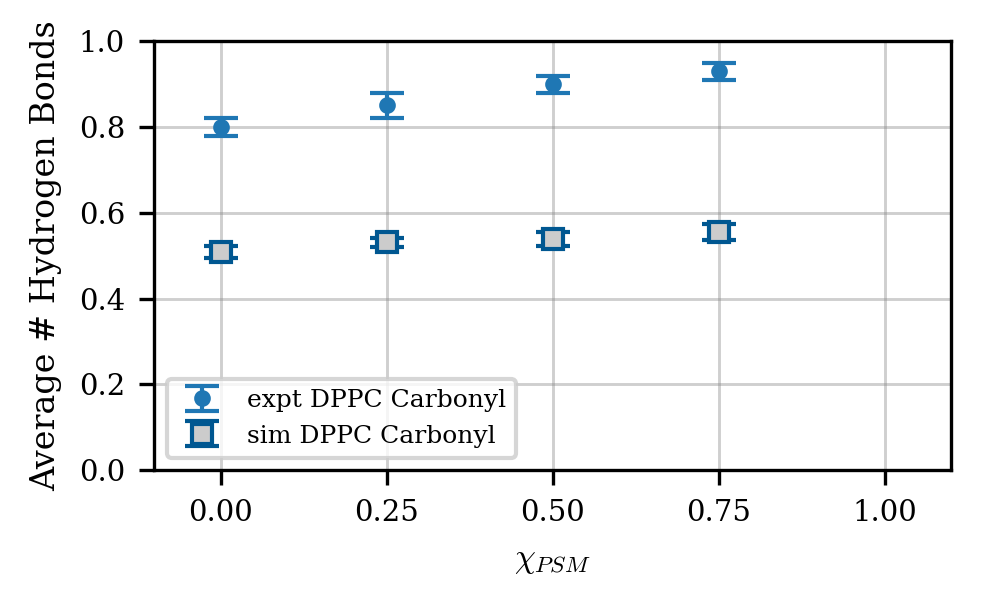

In [86]:
ms = 5
plt.figure(figsize=(3.25, 2), dpi=300)
plt.errorbar(np.arange(0,1,0.25), congmeans, congerrs, alpha=1, marker='o', capsize=4, ms=3,
             label='expt DPPC Carbonyl', ls='')
plt.ylim(0,1)
plt.xlim(-0.1, 1.1)

plt.errorbar(np.arange(0,1.1,0.25), y=avghbonds[0, :, 0], yerr=avghbonds[1, :, 0], 
             marker='s', mec='#005791', c='#cccccc', label='sim DPPC Carbonyl', ms=ms, 
             ls='', ecolor='#005791', capsize=4)

plt.grid(True, alpha=0.4, c='#888888', lw=0.7)
plt.xlabel('$\chi_{PSM}$')
plt.ylabel('Average # Hydrogen Bonds')
plt.legend()
plt.tight_layout()
plt.xticks(np.arange(0,1.0001,0.25))
if saving:
    plt.savefig(f'/Users/shea/dcuments/research/psm-2dir/figures/bootstrapping-ester-{cutoffs}.svg')
plt.show()


output_file = f'/Users/shea/dcuments/research/psm-2dir/figures/bootstrapping-ester-{cutoffs}.csv'
# Open CSV file to write data
if saving:
    psm_conc = np.arange(0,1,0.25)
    with open(output_file, 'w', newline='') as csvfile:
        writer = csv.writer(csvfile)
        
        # Write header
        writer.writerow(['PSM Concentration (χ_PSM)', 'Simulated Value', 'Simulated Error', 
                         'Experimental Value', 'Experimental Error'])
        
        # Loop through concentrations and write corresponding values
        for i in range(len(psm_conc)):
            sim_val = avghbonds[0, i, 0] if i < avghbonds.shape[1] else None
            sim_err = avghbonds[1, i, 0] if i < avghbonds.shape[1] else None
            expt_val = congmeans[i] if i < len(congmeans) else None
            expt_err = congerrs[i] if i < len(congerrs) else None
            
            writer.writerow([psm_conc[i], sim_val, sim_err, expt_val, expt_err])

[0.9905304928989139]
PSM-100, 1.000, 0.903
[0.9905304928989139, 0.9703383458646616]
PSM-100, 1.000, 0.903
[0.9905304928989139, 0.9703383458646616, 0.8862585034013606]
PSM-100, 1.000, 0.903
[0.9905304928989139, 0.9703383458646616, 0.8862585034013606, 0.9080672343131713]
PSM-100, 1.000, 0.903
dict_keys(['PSM-100', 'PSM-75', 'PSM-50', 'PSM-25'])
PSM-100
PSM-75
PSM-50
PSM-25


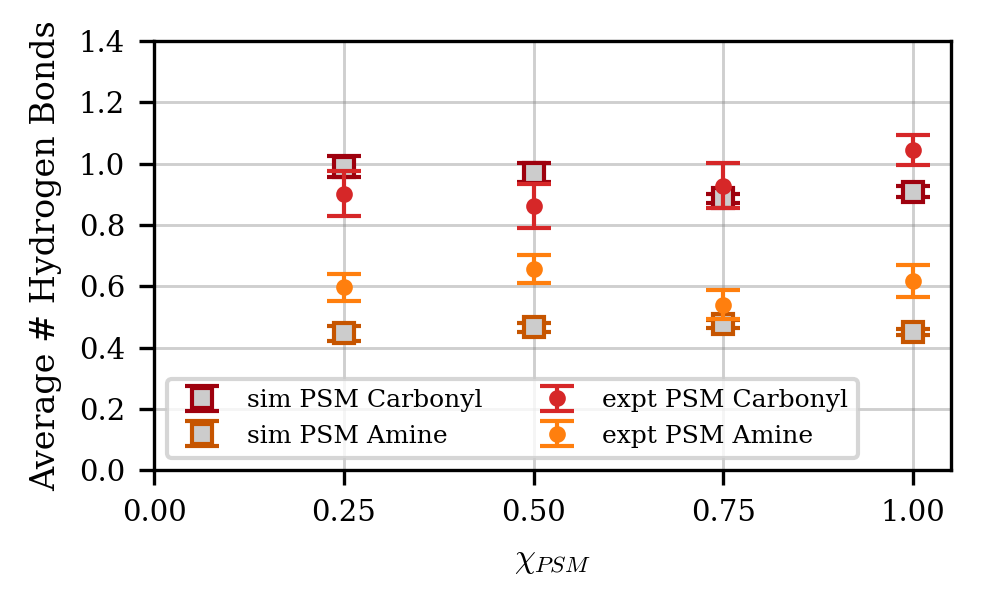

In [87]:
x_vals, sim_co_vals, sim_co_errs = [], [], []
sim_nh_vals, sim_nh_errs = [], []
expt_co_vals, expt_co_errs = [], []
expt_nh_vals, expt_nh_errs = [], []


ms = 5
keyprefix = ''
plt.figure(figsize=(3.25, 2), dpi=300)
for i in range(5):
    if i == 0:
        continue
    # plt.plot((i+1)/4, nco/tot, 's', mec='C3', c='#88888855', label=keyprefix+'sim N$_{CO}$', ms=ms)
    plt.errorbar(i/4, avghbonds[0, i, 1], yerr=avghbonds[1, i, 1], 
                 marker='s', mec='#9e010e', c='#cccccc', label=keyprefix+'sim PSM Carbonyl', 
                 ms=ms, capsize=4, ecolor='#9e010e', ls='', zorder=2)
    sim_co_vals.append(avghbonds[0, i, 1])
    print(sim_co_vals)
    sim_co_errs.append(avghbonds[1, i, 1])

    # error_bars = plt.errorbar((i+1)/4, test[0,i+1,1], yerr=test[1,i+1,1], elinewidth=6, capsize=3, ecolor='#88888888')
    # for cap in error_bars[1]:
    #     cap.set_color('C3')
        
    # plt.plot((i+1)/4, nnh/tot, 's', mec='C0', c='#88888855', label=keyprefix+'sim N$_{NH}$', ms=ms)
    plt.errorbar(i/4, avghbonds[0, i, 2], yerr=avghbonds[1, i, 2], 
                 marker='s', mec='#c65500', c='#cccccc', label=keyprefix+'sim PSM Amine', 
                 ms=ms, capsize=4, ecolor='#c65500', ls='', zorder=2)
    print(f"{perc}, {tot:0.3f}, {nco/tot:0.3f}")
    keyprefix='_'
    x_vals.append(i/4)
    sim_nh_vals.append(avghbonds[0, i, 2])
    sim_nh_errs.append(avghbonds[1, i, 2])

keyprefix = ''
print(gausses.keys())
chainshape = gausses[f'{system}'].chain.shape
nsamples = 100
for s, system in enumerate(systems):
    print(system)
    co_samples = np.zeros(nsamples)
    nh_samples = np.zeros(nsamples)
    for sample in range(nsamples):
        rands = np.random.randint(chainshape[0])
        randw = np.random.randint(chainshape[1])
        randchain = gausses[f'{system}'].chain[rands, randw]
        thisr = 13 # randchain[0] - randchain[2]

        thisc = np.random.normal(0.835, 0.015*2)
        alp = (thisc**-4 - 1)/thisr
        areacorrection = np.sqrt(1 + alp * (randchain[0]-randchain[:6]))
        nh_factor = np.random.rand()
        areacorrection[1] = areacorrection[0] + (areacorrection[1]-areacorrection[0])*nh_factor
        areacorrection[3] = areacorrection[2] + (areacorrection[3]-areacorrection[2])*nh_factor
        areacorrection[5] = areacorrection[4] + (areacorrection[5]-areacorrection[4])*nh_factor
        
        alist = gausses[f'{system}'].chain[:, :, 12:18]
        # print(alist)
        colist = np.sum(alist * np.array([0,0,1,1,2,2]) * areacorrection, axis=2)
        nalist = np.sum(alist * np.array([0,1,0,1,0,1]) * areacorrection, axis=2)
        totlist = np.sum(alist * areacorrection, axis=2)
        y = np.mean(colist/totlist)
        yerr = np.std(colist/totlist)
        y = np.random.normal(y, yerr)
        co_samples[sample] = y
        # plt.errorbar((s+1)/4, y, yerr, c=f'C3', alpha=1, marker='o', capsize=4, ms=3, label=keyprefix+'expt N$_{CO}$', ls='')
        # plt.plot((s+1)/4+np.random.normal(0,0.01), y, c=f'C3', alpha=0.7, marker='o', ms=1, mew=0)

        y = np.mean(nalist/totlist)
        yerr = np.std(nalist/totlist)
        y = np.random.normal(y, yerr)
        nh_samples[sample] = y
        # plt.plot((s+1)/4+np.random.normal(0,0.01), y, c=f'C0', alpha=0.7, marker='o', ms=1, mew=0)

    # y = np.mean(nalist/totlist)
    # yerr = np.std(nalist/totlist)
    yy = np.mean(co_samples)
    ss = np.std(co_samples)
    plt.errorbar((4-s)/4, yy, ss, c=f'C3', 
                 alpha=1, marker='o', capsize=4, ms=3, label=keyprefix+'expt PSM Carbonyl', ls='', zorder=3)
    expt_co_vals.append(yy)
    expt_co_errs.append(ss)

    yy = np.mean(nh_samples)
    ss = np.std(nh_samples)
    plt.errorbar((4-s)/4, yy, ss, c=f'C1', 
                 alpha=1, marker='o', capsize=4, ms=3, label=keyprefix+'expt PSM Amine', ls='', zorder=3)
    expt_nh_vals.append(yy)
    expt_nh_errs.append(ss)
    
    keyprefix = '_'
plt.legend(ncols=2, loc='lower left')
plt.xlim(0,1.05)
plt.xticks(np.arange(0,1.1, 0.25))
plt.ylim(0,1.4)
plt.grid(True, alpha=0.4, c='#888888', lw=0.7)
plt.xlabel('$\chi_{PSM}$')
plt.ylabel('Average # Hydrogen Bonds')
plt.tight_layout()
fname = f'/Users/shea/dcuments/research/psm-2dir/figures/bootstrapping-amide-{cutoffs}'

if saving:
    plt.savefig(f'{fname}.svg')
plt.show()


# Save data to CSV
if saving:
    psm_conc = np.arange(0.25, 1.01, 0.25)
    with open(f'{fname}.csv', 'w', newline='') as csvfile:
        writer = csv.writer(csvfile)
        # Write header
        writer.writerow([
            'PSM Concentration (χ_PSM)', 
            'sim CO values', 'sim CO errors', 'sim NH values', 'sim NH errors', 
            'expt CO values', 'expt CO errors', 'expt NH values', 'expt NH errors', 
        ])
        for i in range(len(psm_conc)):
            writer.writerow([
                psm_conc[i], 
                sim_co_vals[i], sim_co_errs[i], sim_nh_vals[i], sim_nh_errs[i], 
                expt_co_vals[i], expt_co_errs[i], expt_nh_vals[i], expt_nh_errs[i], 
            ])


(12, 90)


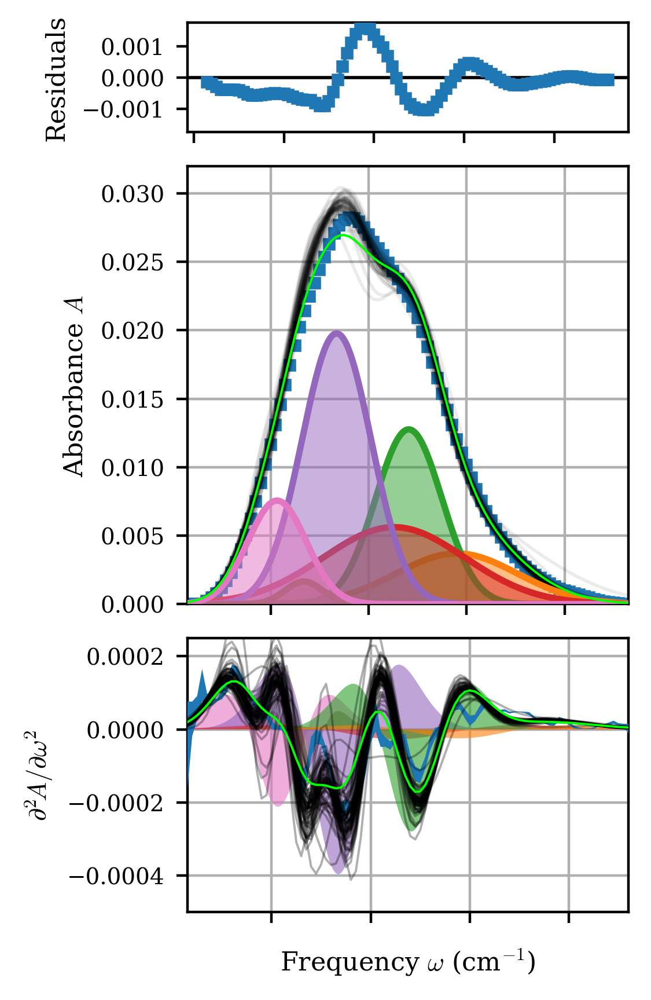

(12, 90)


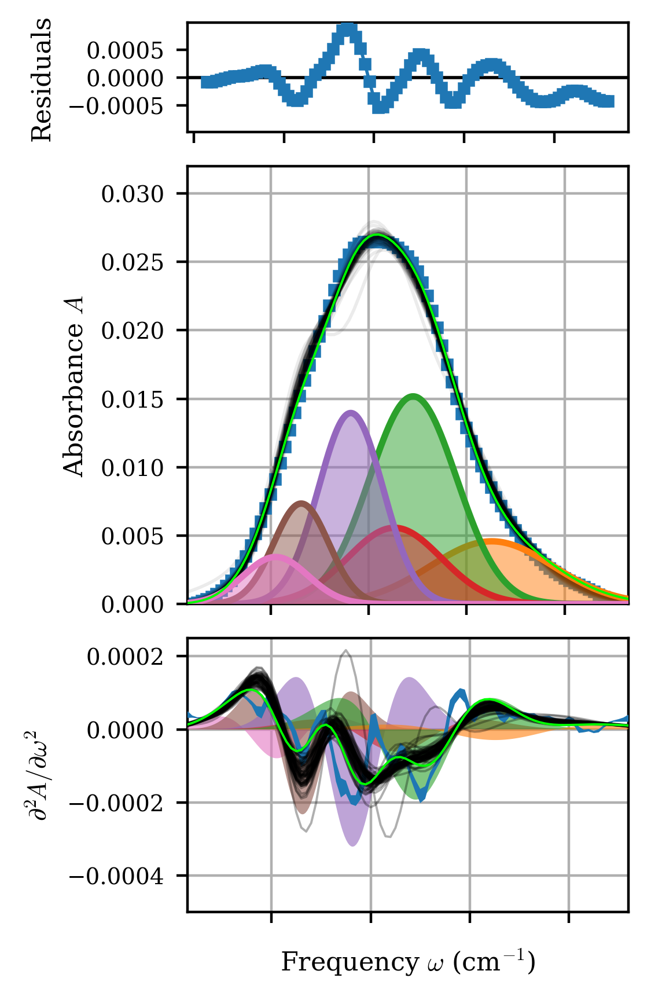

(12, 90)


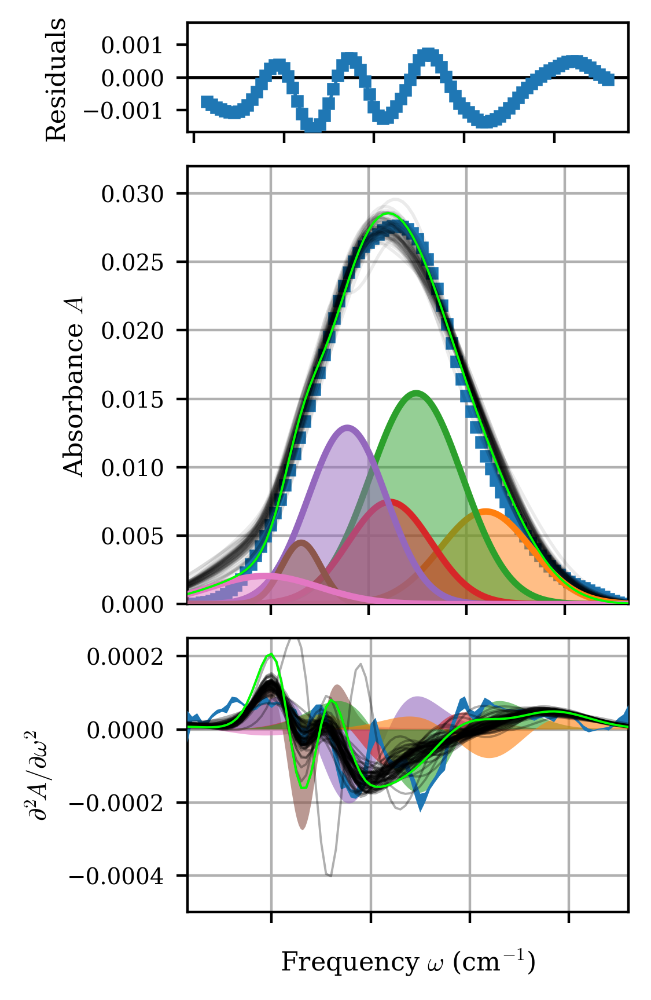

(12, 90)


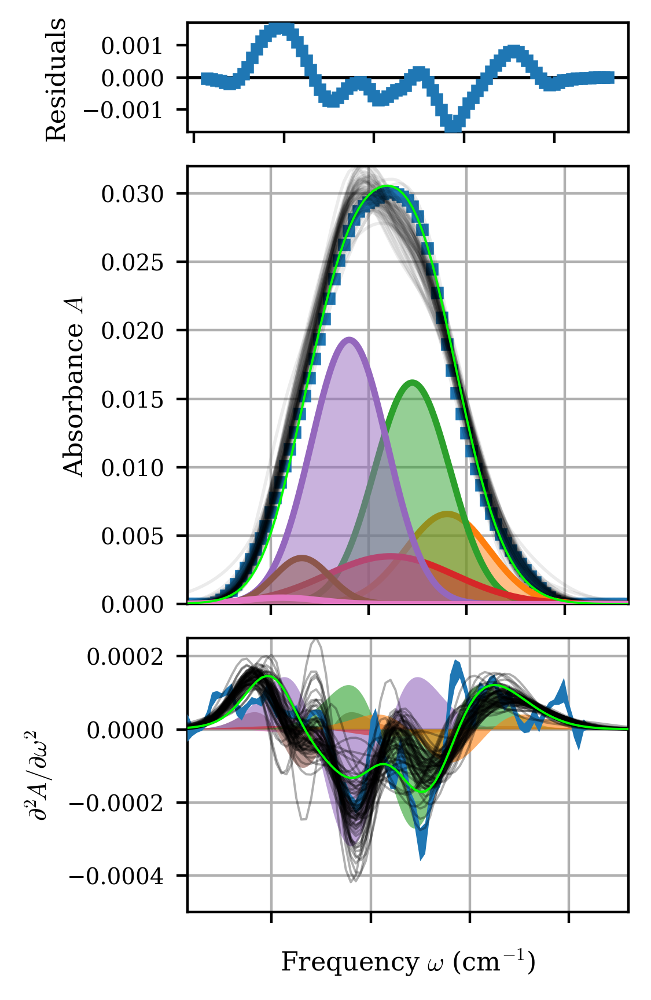

In [91]:
# hhere
method = 'emcee'
# gausses all peaks
systitles = ['100% PSM', '75% PSM', '50% PSM', '25% PSM']
nwalkers = gausses[f'{system}'].chain.shape[1]





    
        # writer.writerow([
        #     'series',  # Fraction
        #     label,          # Bond State
        #     percs[f'PSM-{frac}'][i],  # Experimental Value
        #     simpercs[f'PSM-{frac}'][i]  # Simulated Value
        # ])
            
for ss, system in enumerate(systems):
    output_file = f'/Users/shea/dcuments/research/psm-2dir/figures/nicefits-smaller-{system}.csv'
    with open(output_file, 'w', newline='') as csvfile:
        writer = csv.writer(csvfile)
        # Write header
        writer.writerow(['system', 'series', 'values...'])
    plt.subplots(3, 1, figsize=(6.5*0.43,5/3.25*6.5*0.43), height_ratios=[1, 4, 2.5], dpi=400)
    plt.subplot(312)
    bestn, bests = best_ns[system]

    plt.plot(psm_freqs[first:last], gausses[f'{system}'].data, 's', ms=3)
    # plt.plot(psm_freqs[first:last], gausses[f'{system}'].best_fit, c='#00ff00')
    plt.plot(psm_freqs, sixgauss(psm_freqs, 
                                         *gausses[f'{system}'].chain[bests, bestn, :-1]), c='#00ff00', alpha=1, zorder=5000, lw=0.7)
    plt.xlim(psm_freqs[first], psm_freqs[last])
    x_ = np.linspace(np.min(psm_freqs), np.max(psm_freqs), 500)
    for i in range(1, 7):
        # a = gausses[f'{system}'].best_values[f'a{i}']
        # m = gausses[f'{system}'].best_values[f'm{i}']
        # s = gausses[f'{system}'].best_values[f's{i}']
        m = gausses[f'{system}'].chain[bests, bestn, i-1]
        s = gausses[f'{system}'].chain[bests, bestn, i+5]
        a = gausses[f'{system}'].chain[bests, bestn, i+11]
        y = onegauss(x_, m, s, a)
        plt.fill_between(x_, y, np.zeros_like(y), color=f'C{i}', alpha=0.5, lw=0, 
                         zorder = 100+np.array([0,1,2,3,4,5,6])[i])
        plt.plot(x_, y, color=f'C{i}', alpha=1, lw=2, 
                         zorder = 100.1+np.array([0,1,2,3,4,5,6])[i])
    if method == 'emcee':
        for j in range(nwalkers):
            plt.plot(psm_freqs, sixgauss(psm_freqs, 
                                         *gausses[f'{system}'].chain[-1, j, :-1]), c='k', alpha=5/nwalkers)

    plt.ylim(0, 0.032)
    plt.grid(True)
    
    plt.ylabel('Absorbance $A$')

    # plt.gca().set_yticklabels([])
    plt.gca().set_xticklabels([])

    ##################################################

    plt.subplot(311)
    ddata = gausses[f'{system}'].data
    ybest = sixgauss(psm_freqs[first:last], *gausses[f'{system}'].chain[bests, bestn, :-1])
    plt.plot(psm_freqs[first:last], ddata-ybest, 's-C0', alpha=1, zorder=5000, ms=3)
    plt.axhline(0, c='k')
    plt.gca().set_xticklabels([])
    plt.ylabel('Residuals')
    
    # plt.title(systitles[ss])
    
    # plt.savefig(f'/Users/shea/Downloads/sixgauss-{system}-fromgausses')
    ##################################################
    plt.subplot(313)
    curvelist = np.zeros((0, len(gausses[f'{system}'].data)))
    for width in range(3,8):
        for order in range(2, 5):
            if width > order:
                curvelist = np.concatenate([curvelist, [savgol_filter(gausses[f'{system}'].data, width, order, 2)]], axis=0)
                # plt.plot(psm_freqs[first:first+len(yy)], yy, 'C0-', ms=3, zorder=400)
                # plt.plot(psm_freqs[first:first+len(yy)], savgol_filter(gausses[f'{system}'].best_fit, width, order, 2), 
                #          c='k', zorder=500)
    print(curvelist.shape)
    plt.fill_between(psm_freqs[first:last], 
                     savgol_filter(np.max(curvelist, axis=0), 3, 2), 
                     savgol_filter(np.min(curvelist, axis=0), 3, 2), zorder = 500)
    plt.xlim(psm_freqs[first], psm_freqs[last-1])
    # plt.ylim(-0.01, 0.01)
    x_ = np.linspace(psm_freqs[0], psm_freqs[-1], 400)
    for i in range(1, 7):
        m = gausses[f'{system}'].chain[bests, bestn, i-1]
        s = gausses[f'{system}'].chain[bests, bestn, i+5]
        a = gausses[f'{system}'].chain[bests, bestn, i+11]
        y = onegpp(x_, m, s, a)
        # plt.plot(x_, y, c=f'C{i}', alpha=0.9, lw=1)
        plt.fill_between(x_, y, np.zeros_like(x_), color=f"C{i}", zorder=100-i, alpha=0.6, lw=0)

    if method == 'emcee':
        for j in range(len(gausses[f'{system}'].chain[0, :, 0])):
            # if gausses[f'{system}'].chain[-1, j, 0] > 1740:
            #     c = 'r'
            # else:
            #     c = 'k'
            c='k'
            
            plt.plot(psm_freqs, sixgpp(psm_freqs, 
                                         *gausses[f'{system}'].chain[-1, j, :18]), 
                     c='k', alpha=20/len(gausses[f'{system}'].chain[0, :, 0]), zorder=1000, lw=0.7)

    plt.plot(psm_freqs, sixgpp(psm_freqs, *gausses[f'{system}'].chain[bests, bestn, :18]), 
                     c='#00ff00', alpha=1, zorder=1005, lw=0.7)
    # plt.yscale('log')
    plt.ylim(-0.00050, 0.00025)
    
    plt.grid(True)
    # for freq_ in [1740, 1739, 1742, 1725, 1725, 1727, 1710, 1712]:
    #     plt.axvline(freq_, lw=0.7, c='k')
    # plt.ylabel('2$^{\\rm nd}$ Derivative')
    plt.ylabel('$\partial^2\!A/\partial \omega^2$')
    

    plt.gca().set_xticklabels([])
    plt.xlabel('Frequency $\omega$ (cm$^{-1}$)')

    plt.subplot(311)
    ylims = plt.ylim()
    plt.ylim(np.max(np.abs(ylims))*np.array([-1,1]))

    plt.tight_layout()
    if saving:
        plt.savefig(f'/Users/shea/dcuments/research/psm-2dir/figures/{system}-smaller-nicefits.png', transparent=True)

    plt.show()


(12, 90)


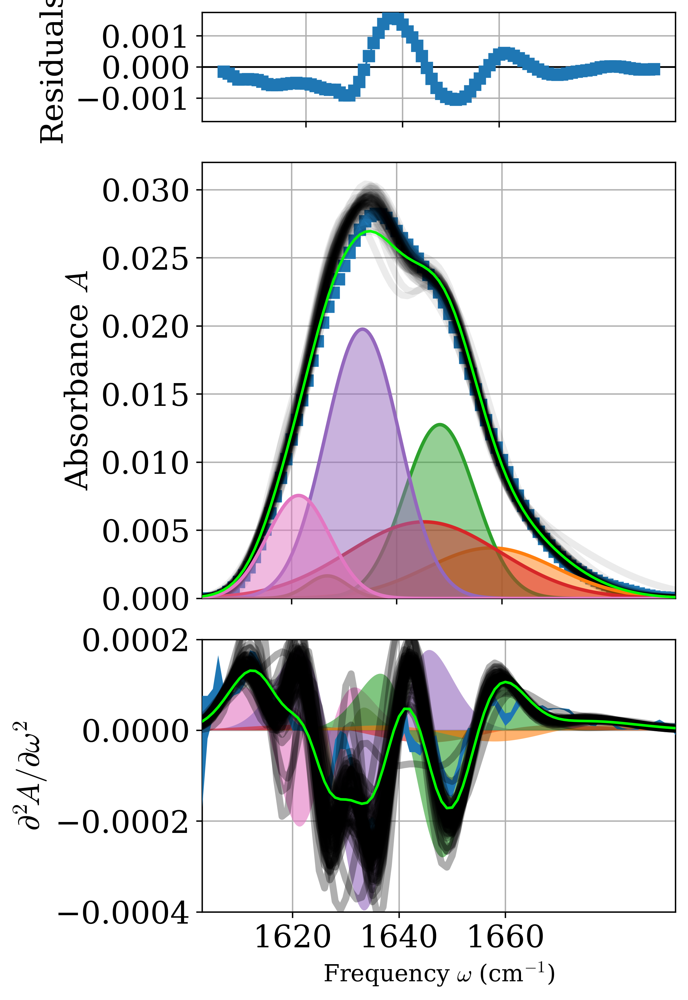

(12, 90)


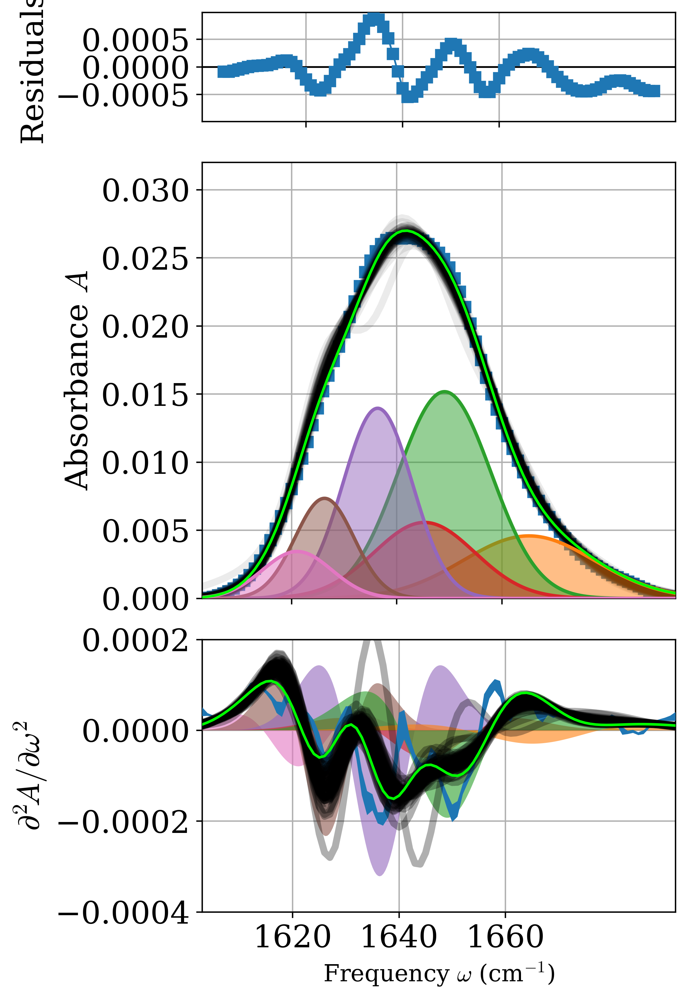

(12, 90)


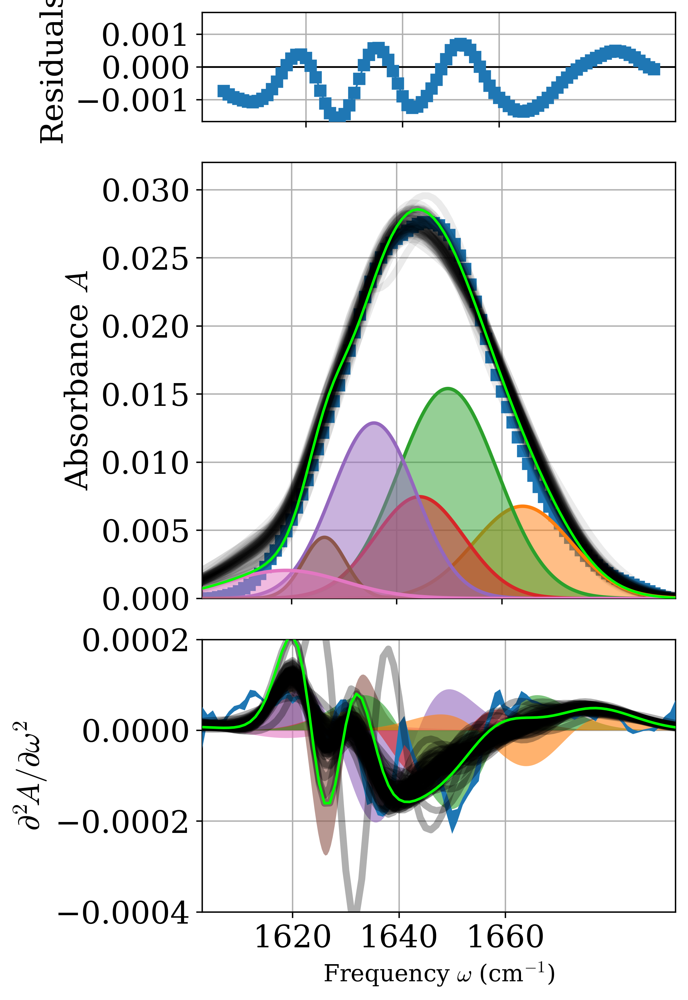

(12, 90)


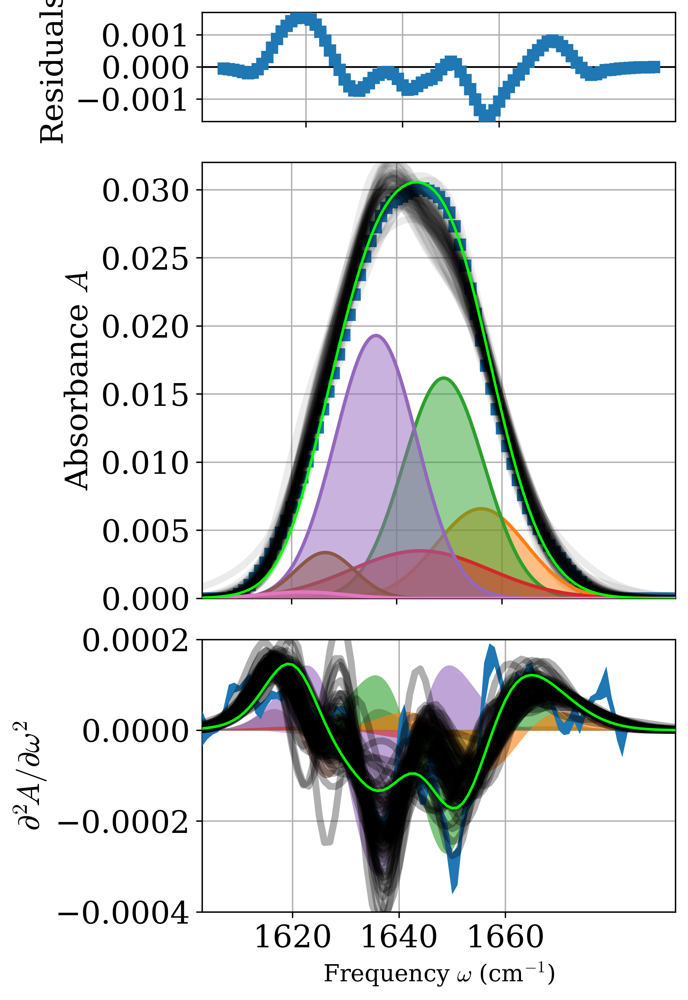

In [92]:
# hhere
method = 'emcee'
# gausses all peaks
systitles = ['100% PSM', '75% PSM', '50% PSM', '25% PSM']
nwalkers = gausses[f'{system}'].chain.shape[1]

ms = 6

fitlw = 4
bestlw = 1.5

fs=18

    
        # writer.writerow([
        #     'series',  # Fraction
        #     label,          # Bond State
        #     percs[f'PSM-{frac}'][i],  # Experimental Value
        #     simpercs[f'PSM-{frac}'][i]  # Simulated Value
        # ])
            
for ss, system in enumerate(systems):
    output_file = f'/Users/shea/dcuments/research/psm-2dir/figures/nicefits-smaller-{system}.csv'
    with open(output_file, 'w', newline='') as csvfile:
        writer = csv.writer(csvfile)
        # Write header
        writer.writerow(['system', 'series', 'values...'])
    plt.subplots(3, 1, figsize=(5.5,8), height_ratios=[1, 4, 2.5], dpi=400)
    plt.subplot(312)
    bestn, bests = best_ns[system]

    plt.plot(psm_freqs[first:last], gausses[f'{system}'].data, 's', ms=ms)
    # plt.plot(psm_freqs[first:last], gausses[f'{system}'].best_fit, c='#00ff00')
    plt.plot(psm_freqs, sixgauss(psm_freqs, 
                                 *gausses[f'{system}'].chain[bests, bestn, :-1]), 
             c='#00ff00', alpha=1, zorder=5000, lw=bestlw)
    plt.xlim(psm_freqs[first], psm_freqs[last])
    x_ = np.linspace(np.min(psm_freqs), np.max(psm_freqs), 500)
    for i in range(1, 7):
        # a = gausses[f'{system}'].best_values[f'a{i}']
        # m = gausses[f'{system}'].best_values[f'm{i}']
        # s = gausses[f'{system}'].best_values[f's{i}']
        m = gausses[f'{system}'].chain[bests, bestn, i-1]
        s = gausses[f'{system}'].chain[bests, bestn, i+5]
        a = gausses[f'{system}'].chain[bests, bestn, i+11]
        y = onegauss(x_, m, s, a)
        plt.fill_between(x_, y, np.zeros_like(y), color=f'C{i}', alpha=0.5, lw=0, 
                         zorder = 100+np.array([0,1,2,3,4,5,6])[i])
        plt.plot(x_, y, color=f'C{i}', alpha=1, lw=2, 
                         zorder = 100.1+np.array([0,1,2,3,4,5,6])[i])
    if method == 'emcee':
        for j in range(nwalkers):
            plt.plot(psm_freqs, sixgauss(psm_freqs, 
                                         *gausses[f'{system}'].chain[-1, j, :-1]), c='k', alpha=5/nwalkers, lw=fitlw)

    plt.ylim(0, 0.032)
    plt.grid(True)
    
    plt.ylabel('Absorbance $A$', size=fs)
    plt.yticks(size=fs)

    # plt.gca().set_yticklabels([])
    # plt.gca().set_xticklabels([])
    plt.xticks(np.arange(1620, 1679, 20), labels=[])

    ##################################################

    plt.subplot(311)
    ddata = gausses[f'{system}'].data
    ybest = sixgauss(psm_freqs[first:last], *gausses[f'{system}'].chain[bests, bestn, :-1])
    plt.plot(psm_freqs[first:last], ddata-ybest, 's-C0', alpha=1, zorder=5000, ms=ms)
    plt.axhline(0, c='k')
    # plt.gca().set_xticklabels([])
    plt.xticks(np.arange(1620, 1679, 20), labels=[])
    plt.ylabel('Residuals', size=fs)
    plt.yticks(size=fs)
    plt.grid(True)
    
    # plt.title(systitles[ss])
    
    # plt.savefig(f'/Users/shea/Downloads/sixgauss-{system}-fromgausses')
    ##################################################
    plt.subplot(313)
    curvelist = np.zeros((0, len(gausses[f'{system}'].data)))
    for width in range(3,8):
        for order in range(2, 5):
            if width > order:
                curvelist = np.concatenate([curvelist, [savgol_filter(gausses[f'{system}'].data, width, order, 2)]], axis=0)
                # plt.plot(psm_freqs[first:first+len(yy)], yy, 'C0-', ms=3, zorder=400)
                # plt.plot(psm_freqs[first:first+len(yy)], savgol_filter(gausses[f'{system}'].best_fit, width, order, 2), 
                #          c='k', zorder=500)
    print(curvelist.shape)
    plt.fill_between(psm_freqs[first:last], 
                     savgol_filter(np.max(curvelist, axis=0), 3, 2), 
                     savgol_filter(np.min(curvelist, axis=0), 3, 2), zorder = 500)
    plt.xlim(psm_freqs[first], psm_freqs[last-1])
    # plt.ylim(-0.01, 0.01)
    x_ = np.linspace(psm_freqs[0], psm_freqs[-1], 400)
    for i in range(1, 7):
        m = gausses[f'{system}'].chain[bests, bestn, i-1]
        s = gausses[f'{system}'].chain[bests, bestn, i+5]
        a = gausses[f'{system}'].chain[bests, bestn, i+11]
        y = onegpp(x_, m, s, a)
        # plt.plot(x_, y, c=f'C{i}', alpha=0.9, lw=1)
        plt.fill_between(x_, y, np.zeros_like(x_), color=f"C{i}", zorder=100-i, alpha=0.6, lw=0)

    if method == 'emcee':
        for j in range(len(gausses[f'{system}'].chain[0, :, 0])):
            # if gausses[f'{system}'].chain[-1, j, 0] > 1740:
            #     c = 'r'
            # else:
            #     c = 'k'
            c='k'
            
            plt.plot(psm_freqs, sixgpp(psm_freqs, 
                                         *gausses[f'{system}'].chain[-1, j, :18]), 
                     c='k', alpha=20/len(gausses[f'{system}'].chain[0, :, 0]), zorder=1000, lw=fitlw)

    plt.plot(psm_freqs, sixgpp(psm_freqs, *gausses[f'{system}'].chain[bests, bestn, :18]), 
                     c='#00ff00', alpha=1, zorder=1005, lw=bestlw)
    # plt.yscale('log')
    plt.ylim(-0.00035, 0.0002)
    
    plt.grid(True)
    # for freq_ in [1740, 1739, 1742, 1725, 1725, 1727, 1710, 1712]:
    #     plt.axvline(freq_, lw=0.7, c='k')
    # plt.ylabel('2$^{\\rm nd}$ Derivative')
    plt.ylabel('$\partial^2\!A/\partial \omega^2$', size=fs)
    plt.yticks(np.arange(-0.0004, 0.00021, 0.0002), size=fs)
    

    # plt.gca().set_xticklabels([])
    plt.xticks(np.arange(1620, 1679, 20), size=fs)
    plt.xlabel('Frequency $\omega$ (cm$^{-1}$)', size=fs*0.75)

    plt.subplot(311)
    ylims = plt.ylim()
    plt.ylim(np.max(np.abs(ylims))*np.array([-1,1]))

    plt.tight_layout()
    if saving:
        plt.savefig(f'/Users/shea/dcuments/research/psm-2dir/figures/{system}-bigger-nicefits.png', transparent=True)

    plt.show()
